## 08. PyTorch Paper Replicating

- https://www.learnpytorch.io/08_pytorch_paper_replicating/

여기서는 vision transformer 연구 논문을 실습

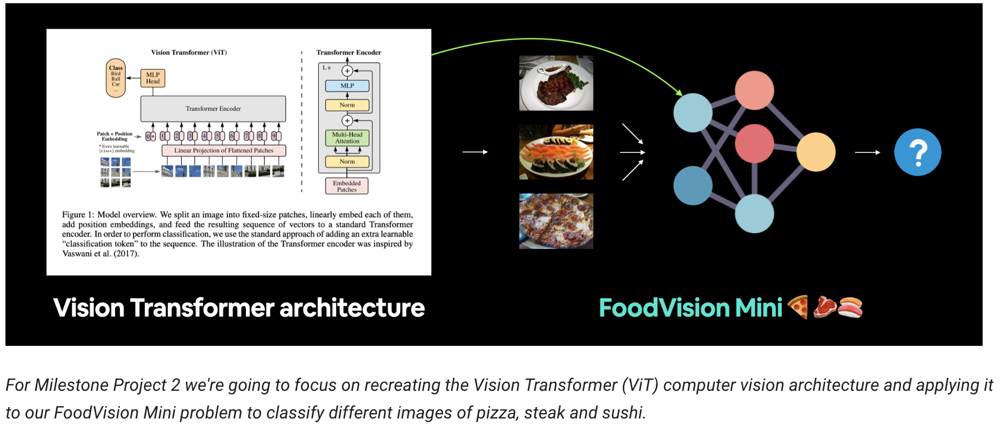

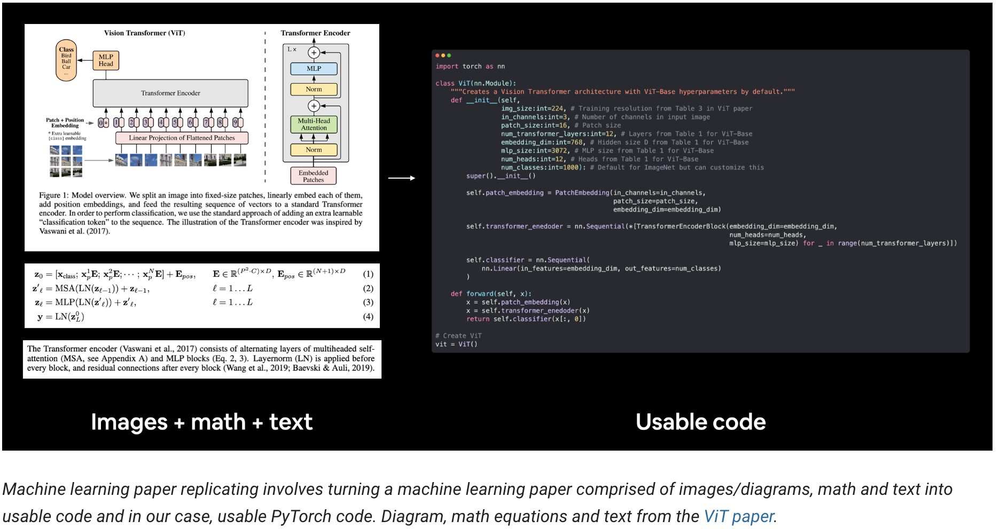

Where can you find code examples for machine learning research papers?

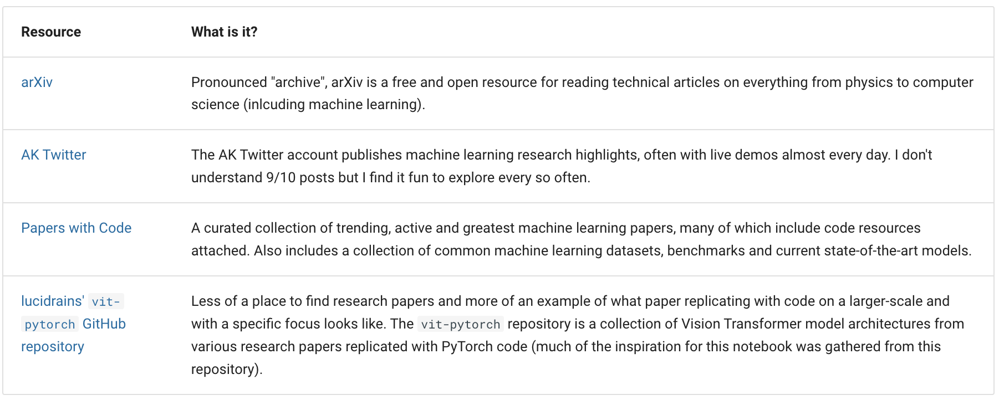

- https://github.com/lucidrains/vit-pytorch

논문을 복제하는 것에 대해 이야기하는 대신 실제로 논문을 복제해 보겠습니다.

모든 논문을 복제하는 과정은 조금씩 다르겠지만, 한 논문을 복제하는 것이 어떤 것인지 확인함으로써 더 많은 논문을 복제할 수 있는 원동력을 얻을 수 있을 것입니다.  

좀 더 구체적으로, 머신러닝 연구 논문인 '이미지가 16x16 단어의 가치가 있다'를 복제할 예정입니다: 대규모 이미지 인식을 위한 트랜스포머(PyTorch를 사용한 대규모 이미지 인식을 위한 트랜스포머(ViT 논문)).  

트랜스포머 신경망 아키텍처는 원래 머신 러닝 연구 논문 Attention is all you need에서 소개되었습니다.  

그리고 원래 Transformer 아키텍처는 1차원(1D) 텍스트 시퀀스에서 작동하도록 설계되었습니다.  

트랜스포머 아키텍처는 일반적으로 어텐션 메커니즘을 사용하는 모든 신경망을 기본 학습 계층으로 간주합니다. 컨볼루션 신경망(CNN)이 컨볼루션을 기본 학습 계층으로 사용하는 방식과 유사합니다. 

이름에서 알 수 있듯이, 비전 트랜스포머(ViT) 아키텍처는 원래의 트랜스포머 아키텍처를 비전 문제에 맞게 조정하기 위해 설계되었습니다(분류가 최초이며 이후 많은 다른 분류가 뒤따랐습니다).  

오리지널 비전 트랜스포머는 지난 몇 년 동안 여러 번의 반복을 거쳤지만, 여기서는 '바닐라 비전 트랜스포머'로 알려진 오리지널을 복제하는 데 초점을 맞출 것입니다. 원작을 재현할 수 있다면 다른 작품에도 적용할 수 있기 때문입니다.  

우리는 원본 ViT 문서에 따라 ViT 아키텍처를 구축하고 이를 FoodVision Mini에 적용하는 데 집중할 것입니다.

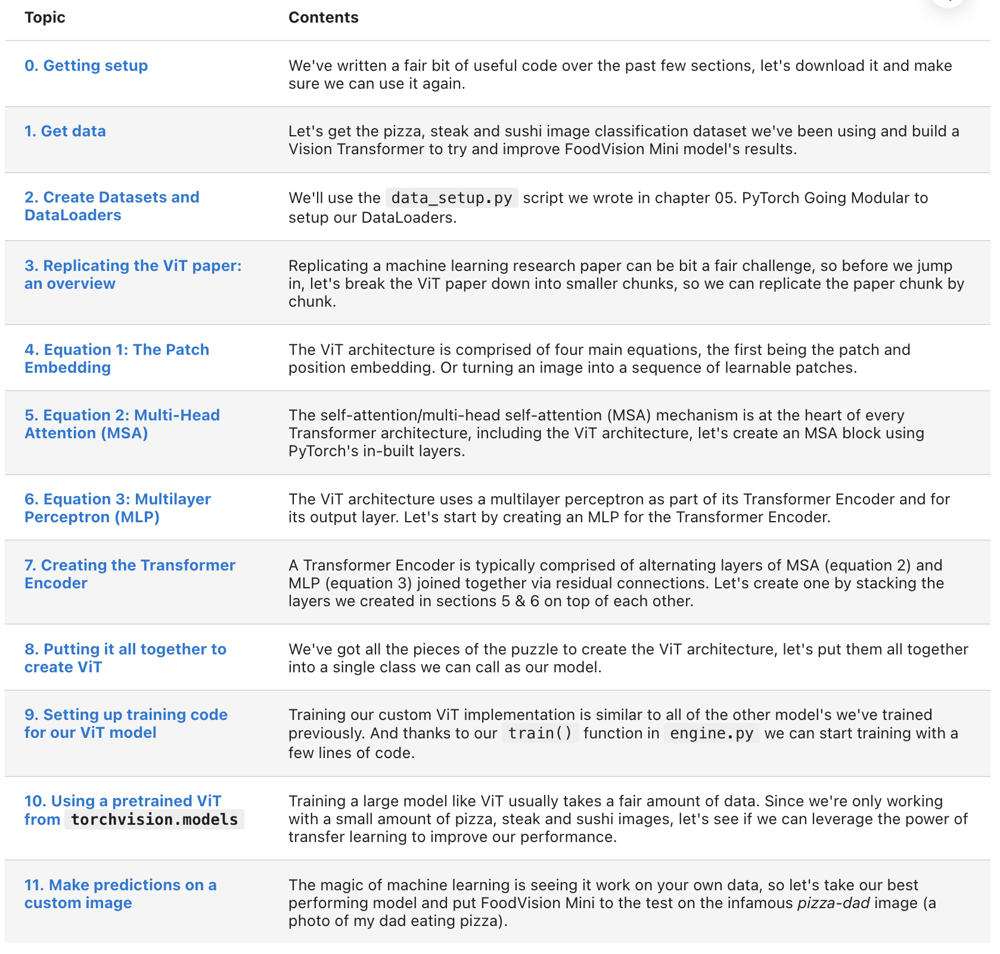

In [1]:
import os
import matplotlib.pyplot as plt
import torch
import torchvision

from torch import nn
from torchvision import transforms

from torchinfo import summary

from going_modular import data_setup, engine
from helper_functions import download_data, set_seeds, plot_loss_curves

/Users/sguys99/anaconda3/envs/torch/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

In [3]:
device = "mps" if torch.backends.mps.is_available() else "cpu"
device

'mps'

### 1. Get Data

In [4]:
# Download pizza, steak, sushi images from GitHub
image_path = download_data(source="https://github.com/mrdbourke/pytorch-deep-learning/raw/main/data/pizza_steak_sushi.zip",
                           destination="pizza_steak_sushi")
image_path

[INFO] data/pizza_steak_sushi directory exists, skipping download.


PosixPath('data/pizza_steak_sushi')

In [5]:
os.listdir(image_path)

['test', 'train']

In [6]:
# Setup directory paths to train and test images
train_dir = image_path / "train"
test_dir = image_path / "test"

### 2. Create Datasets and Dataloaders

이제 데이터가 생겼으니 이제 데이터를 DataLoader의 데이터로 전환해 보겠습니다.  
이를 위해 data_setup.py의 create_dataloaders() 함수를 사용할 수 있습니다.  
먼저 이미지를 준비하기 위해 트랜스폼을 생성합니다.  
여기에서 ViT 백서에 대한 첫 번째 참조 중 하나가 들어옵니다.  
표 3에서 학습 해상도는 224(높이=224, 너비=224)로 언급되어 있습니다.

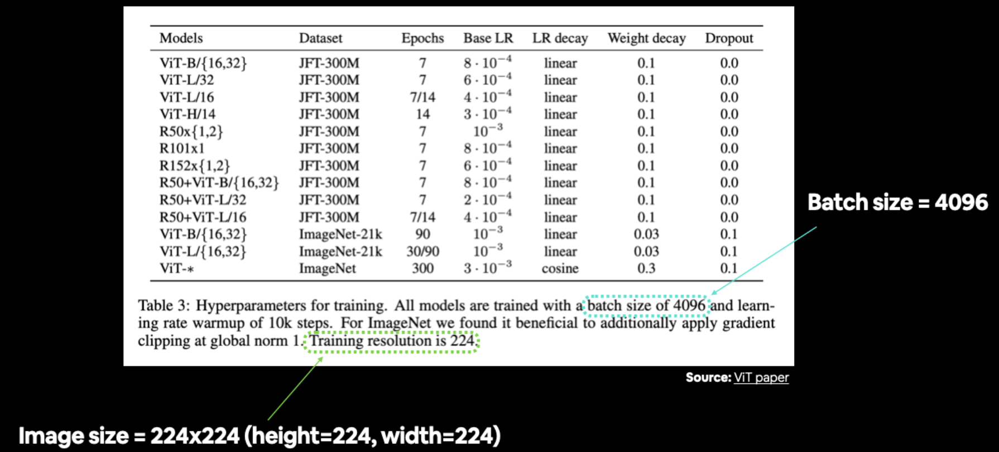

표에 다양한 하이퍼파라미터 설정이 나열되어 있는 경우가 많습니다. 이 경우에는 아직 데이터를 준비 중이므로 주로 이미지 크기 및 배치 크기와 같은 항목에 중점을 두고 있습니다. 출처: ViT 백서의 표 3.

따라서 트랜스폼이 이미지 크기를 적절하게 조정하도록 하겠습니다.

그리고 처음부터 모델을 훈련할 것이므로(처음부터 전이 학습을 하지 않을 것입니다), 06에서 했던 것처럼 정규화 트랜스폼을 제공하지 않을 것입니다. 파이토치 전이 학습 섹션 2.1을 참고하세요.

#### 2.1 Prepare transforms for images

In [7]:
# Create image size (from Table 3 in the ViT paper) 
IMG_SIZE = 224

# Create transform pipeline manually
manual_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
])           
print(f"Manually created transforms: {manual_transforms}")

Manually created transforms: Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=warn)
    ToTensor()
)


#### 2.2 Turn images into DataLoader's

이제 DataLoader를 생성할 차례다.  
논문에는 우리가 사용하던 배치 32의 128배인 4096을 사용한다고 했다.  
하지만 여기서는 32를 사용한다.  
4096은 매우 크기 때문이다.


이제 데이터로더를 만들어 보겠습니다.  
ViT 백서에는 우리가 사용하던 배치 크기(32)의 128배인 4096의 배치 크기를 사용한다고 명시되어 있습니다.  
하지만 여기서는 배치 크기 32를 고수하겠습니다.  

일부 하드웨어(Google Colab의 무료 티어 포함)는 배치 크기 4096을 처리하지 못할 수 있기 때문입니다.
배치 크기가 4096이라는 것은 한 번에 4096개의 이미지를 GPU 메모리에 넣어야 한다는 의미입니다.

이 방법은 Google의 연구팀처럼 하드웨어가 이를 처리할 수 있는 경우에 적합하지만, 단일 GPU에서 실행하는 경우(예: Google Colab 사용)에는 먼저 더 작은 배치 크기로 작동하는지 확인하는 것이 좋습니다.

참고 :   

계산 속도를 높이기 위해 create_dataloaders() 함수에서 pin_memory=True 매개변수를 사용하고 있습니다.  
pin_memory=True는 이전에 보았던 예제를 "고정"하여 CPU와 GPU 메모리 간에 불필요한 메모리 복사를 방지합니다.  
이 옵션의 이점은 데이터 세트 크기가 클수록 더 잘 드러나지만(FoodVision Mini 데이터 세트는 상당히 작습니다).   
그러나 pin_memory=False로 설정한다고 해서 항상 성능이 향상되는 것은 아니므로(머신 러닝에서 어떤 것은 작동하고 어떤 것은 작동하지 않는 시나리오 중 하나입니다) 실험하고, 실험하고, 실험하는 것이 가장 좋습니다.  
자세한 내용은 PyTorch torch.utils.data.DataLoader 문서 또는 Horace He의 '첫 번째 원칙에서 딥 러닝을 시작하기(Making Deep Learning Go Brrrr)'를 참조하세요.

In [8]:
BATCH_SIZE = 32

train_dataloader, test_dataloader, class_names = data_setup.create_dataloaders(
    train_dir=train_dir,
    test_dir = test_dir,
    transform = manual_transforms,
    batch_size=BATCH_SIZE
)

train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x10346e860>,
 ['pizza', 'steak', 'sushi'])

#### 2.3 Visualize a single image

ViT 문서에서 중요한 단계는 이미지를 패치로 준비하는 것입니다.

이것이 무엇을 의미하는지 섹션 4에서 살펴보겠지만, 지금은 하나의 이미지와 그 레이블을 살펴보겠습니다.

이를 위해 데이터 배치에서 단일 이미지와 레이블을 가져와서 그 모양을 살펴보겠습니다.

In [9]:
image_batch, label_batch = next(iter(train_dataloader))

image, label = image_batch[0], label_batch[0]

image.shape, label

(torch.Size([3, 224, 224]), tensor(2))

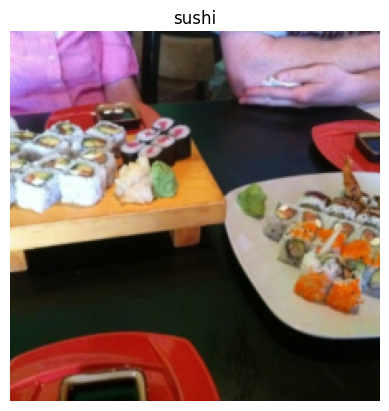

In [10]:
plt.imshow(image.permute(1, 2, 0)) # dimension 재배치
plt.title(class_names[label])
plt.axis(False);

### 3. Replicating the ViT paper: an overview

코드를 더 작성하기 전에 우리가 무엇을 하고 있는지 논의해 보겠습니다.   
우리는 우리 자신의 문제인 FoodVision Mini에 대해 ViT 논문을 복제하려고 합니다.  
모델 입력은 피자, 스테이크, 스시 이미지입니다.   
그리고 이상적인 모델 출력은 피자, 스테이크, 초밥의 예상 라벨입니다.   
이전 섹션에서 수행한 작업과 다르지 않습니다.   
문제는 입력에서 원하는 출력으로 어떻게 이동하느냐는 것입니다.  

#### 3.1 Inputs and outputs, layers and blocks

ViT는 딥러닝 신경망 아키텍처입니다.  
그리고 모든 신경망 아키텍처는 일반적으로 레이어로 구성됩니다.  
그리고 레이어의 집합을 흔히 블록이라고 합니다.   
그리고 여러 블록을 쌓아 올리면 전체 아키텍처가 완성됩니다.  
레이어는 입력(예: 이미지 텐서)을 받아 어떤 종류의 함수(예: 레이어의 forward() 메서드에 있는 것)를 수행한 다음 출력을 반환합니다.  
따라서 단일 레이어가 입력을 받아 출력을 제공한다면 레이어 모음이나 블록도 입력을 받아 출력을 제공합니다.  
이를 구체적으로 살펴봅시다:  


- 레이어 : 입력을 받아 함수를 수행한 후 출력을 반환합니다.
- 블록 : 레이어의 모음으로, 입력을 받고 일련의 함수를 수행한 후 출력을 반환합니다.
- 아키텍처(또는 모델) : 블록의 모음으로, 입력을 받아 일련의 함수를 수행한 후 출력을 반환합니다.

이 개념은 우리가 ViT 논문을 복제하는 데 사용할 것입니다.

레이어별로, 블록별로, 함수 별로 퍼즐 조각을 레고처럼 조립하여 원하는 전체 아키텍처를 만들 것입니다.

이렇게 하는 이유는 전체 연구 논문을 보는 것이 부담스러울 수 있기 때문입니다.

따라서 이해를 돕기 위해 단일 레이어의 입력과 출력부터 시작하여 전체 모델의 입력과 출력까지 세분화하여 살펴보겠습니다.

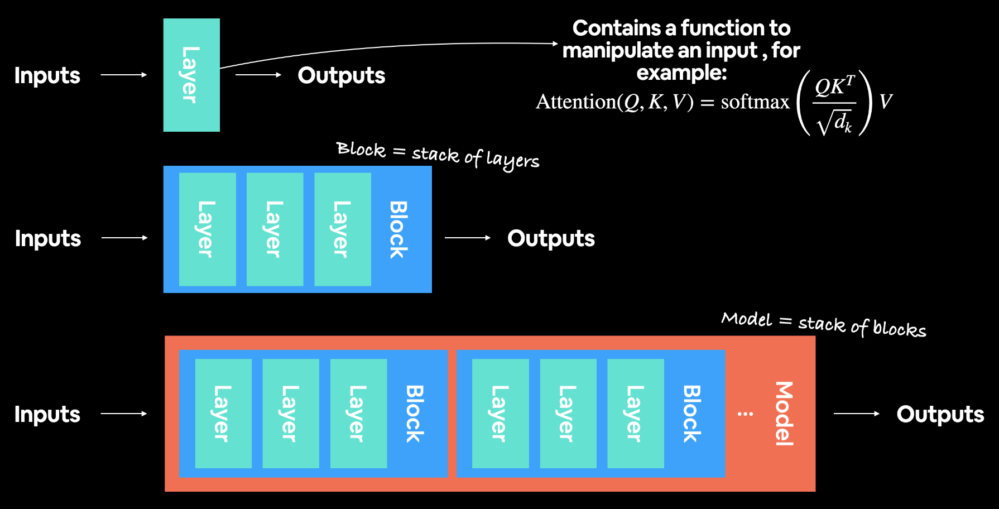

- 최신 딥러닝 아키텍처는 일반적으로 레이어와 블록의 집합입니다. 
- 레이어는 입력(수치로 표현된 데이터)을 받아 일종의 함수(예: 위 그림의 자기 주의 공식)를 사용하여 조작한 다음 를 출력합니다.   
- 블록은 일반적으로 단일 레이어와 유사한 작업을 여러 번 수행하는 레이어를 서로 겹쳐서 쌓은 것입니다.

#### 3.2 Getting specific: What's ViT made of?

이 백서 곳곳에 ViT 모델에 대한 작은 세부 사항이 많이 있습니다.  
이 모든 것을 찾는 것은 마치 하나의 커다란 보물찾기와 같습니다!  
연구 논문은 수개월에 걸친 작업이 몇 페이지로 압축된 경우가 많으므로 이를 복제하는 데 연습이 필요한 것은 이해할 수 있습니다.
하지만 아키텍처 설계를 위해 살펴볼 주요 세 가지 리소스는 다음과 같습니다:

1. Figure 1 : 이것은 그래픽으로 모델의 개요를 제공하며, 이 그림만으로도 아키텍처를 거의 재현할 수 있습니다.
2. Four equations in section 3.1 : 이 방정식은 그림 1의 색깔쳐진 블록에 대한 수학적 근거를 조금 더 제공합니다.
3. Table 1 : 다양한 ViT 모델 변형에 대한 다양한 하이퍼파라미터 설정(예: 레이어 수 및 숨겨진 유닛 수)을 보여줍니다. 여기서는 가장 작은 버전인 ViT-Base에 초점을 맞추겠습니다

3.2.1 Exploring Figure 1    

ViT 백서의 그림 1부터 살펴보겠습니다.

우리가 주목해야 할 주요 사항은 다음과 같습니다:

- 레이어 - 입력을 받고, 입력에 대해 연산 또는 함수를 수행하여 출력을 생성합니다.
- 블록 - 레이어의 모음으로, 역시 입력을 받아 출력을 생성합니다.

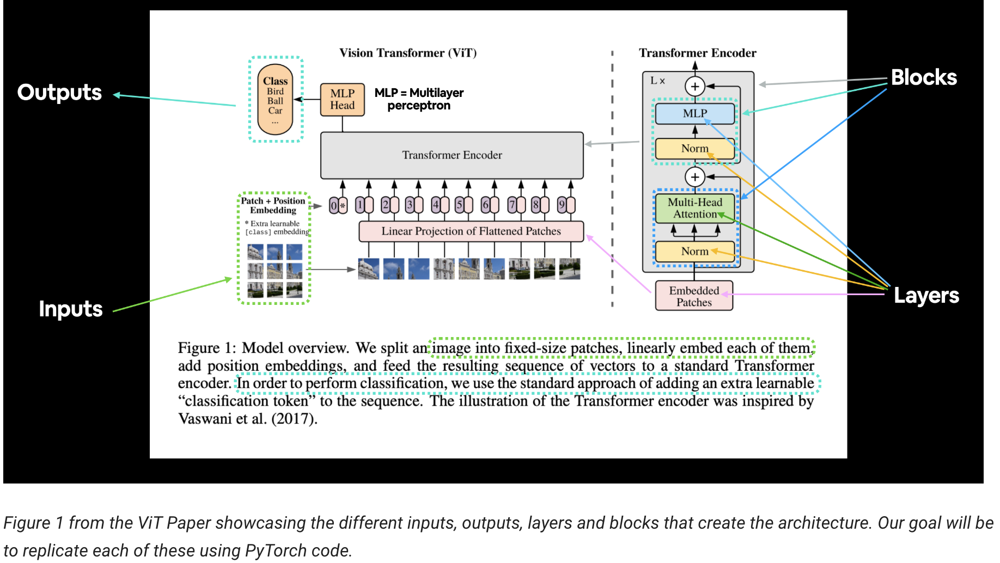

ViT 아키텍처는 몇가지 스테이지로 되어있다.  

- `Patch + Position Embedding (inputs)` : 입력 이미지를 이미지 패치 시퀀스로 변환하고 위치 번호를 추가하여 패치가 들어오는 순서를 지정합니다.  

- `Linear projection of flattened patches (Embedded Patches)` : 이미지 패치가 임베딩으로 변환되며, 이미지 값 대신 임베딩을 사용하면 임베딩이 학습 가능한 이미지 표현(일반적으로 벡터 형태)으로 학습을 통해 개선할 수 있다는 이점이 있습니다.  

- `Norm` - 신경망을 정규화(과적합 감소)하는 기술인 "레이어 정규화" 또는 "레이어 표준"의 줄임말로, PyTorch 레이어 torch.nn.LayerNorm()을 통해 LayerNorm을 사용할 수 있습니다.   

- `Multi-Head Attention` - 멀티 헤드 셀프 어텐션 레이어 또는 줄여서 "MSA"입니다. PyTorch 레이어 torch.nn.MultiheadAttention()을 통해 MSA 레이어를 생성할 수 있습니다.   

- `MLP (or Multilayer perceptron)` : MLP는 종종 피드포워드 레이어 모음(또는 PyTorch의 경우 forward() 메서드가 있는 레이어 모음)을 지칭할 수 있습니다. ViT 백서에서 저자들은 MLP를 "MLP 블록"이라고 부르며, 여기에는 두 개의 torch.nn.Linear() 레이어와 그 사이에 torch.nn.GELU() 비선형성 활성화(섹션 3.1) 및 각 레이어 뒤에 torch.nn.Dropout() 레이어가 포함되어 있습니다(부록 B.1).  

- `Transformer Encoder` : 트랜스포머 인코더는 위에 나열된 레이어의 모음입니다. 트랜스포머 인코더 내부에는 두 개의 스킵 연결("+" 기호)이 있으며, 이는 레이어의 입력이 바로 앞 레이어와 후속 레이어에 직접 공급된다는 의미입니다. 전체 ViT 아키텍처는 여러 개의 트랜스포머 인코더를 겹겹이 쌓아 올린 구조로 구성되어 있습니다.   

- `MLP Head` : 아키텍처의 출력 레이어로, 입력의 학습된 특징을 클래스 출력으로 변환합니다. 이미지 분류 작업을 하기 때문에 '분류기 헤드'라고도 부를 수 있습니다. MLP 헤드의 구조는 MLP 블록과 유사합니다.  

ViT는 기존 파이토치 레이어로 구현할 수 있음을 알수 있다.  


이제 Figure 1을 보고 우리의 문제로 바꿔보자.


3.2.2 Exploring the Four Equations

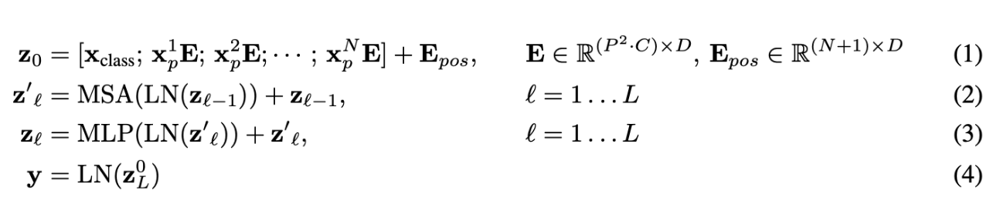

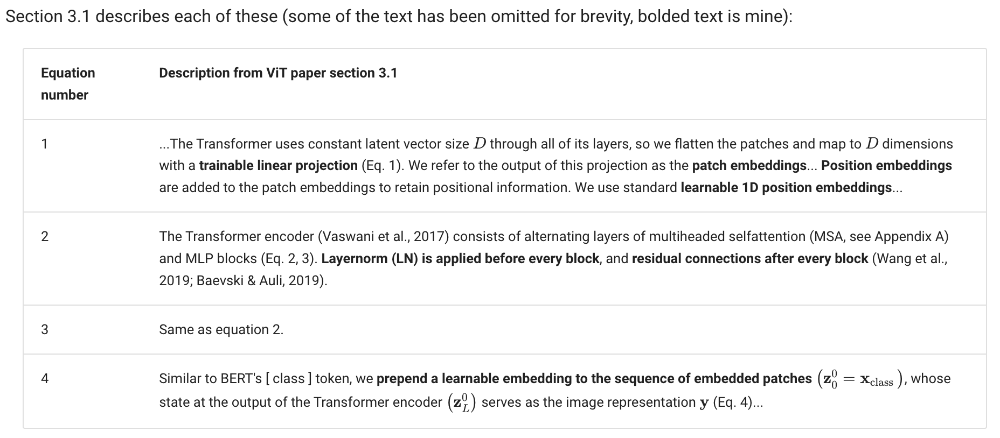

수식에 대한 설명은 다음과 같다.   
- 1: ...트랜스포머는 모든 레이어에서 일정한 잠재 벡터 크기 D를 사용하므로 패치를 평평하게 하고 훈련 가능한 선형 투영을 사용하여 D 차원으로 매핑합니다(방정식 1). 이 투영의 출력을 패치 임베딩이라고 합니다... 위치 정보를 유지하기 위해 패치 임베딩에 위치 임베딩이 추가됩니다. 우리는 표준 학습 가능한 1D 위치 임베딩을 사용합니다...   
- 2: 트랜스포머 인코더(Vaswani et al., 2017)는 멀티헤드 셀프어텐션(MSA, 부록 A 참조)과 MLP 블록(식 2, 3)의 교대 레이어로 구성됩니다. 레이어노름(LN)은 모든 블록 전에 적용되고, 잔여 연결은 모든 블록 후에 적용됩니다(Wang et al., 2019; Baevski & Auli, 2019).  
- 3: 2와 같음
- 4: 버트의 클래스 토큰과 유사하게 임베딩된 패치 시퀀스에 학습 가능한 임배딩을 추가합니다. 따라서 트랜스포어 인코더의 출력은 이미지 representation 역할을 합니다.

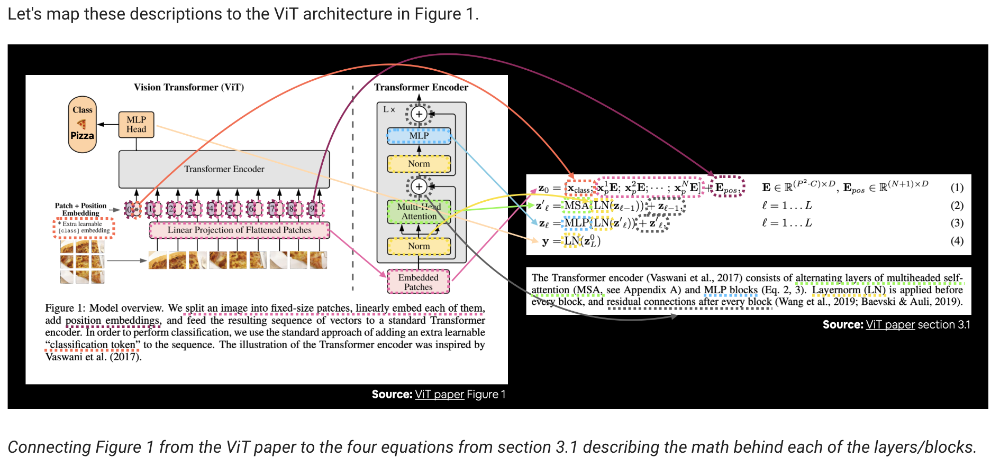

위 이미지에는 많은 일이 일어나고 있지만 색칠된 선과 화살표를 따라가다 보면 ViT 아키텍처의 주요 개념이 드러납니다.
각 방정식을 좀 더 세분화해 보면 어떨까요(코드로 다시 만드는 것이 목표입니다)?

방정식 4를 제외한 모든 방정식에서 "z"는 특정 레이어의 원시 출력입니다:
- z0 는 임베딩 레이어의 초기 패치이다.  
- z`l 는 z의 중간 값이다.  
- zl는 특정레이어의 z   

y는 아키텍처의 전체 출력이다.

3.2.3 Equation 1 overview

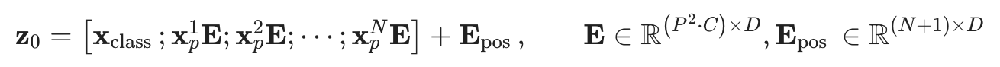

z0은 클래스 토큰, 패치임배딩, 포지션 임베딩을 다루는 부분이다.   

벡터폼은 다음과 같다.  


x_input = [class_token, image_patch_1, image_patch_2, image_patch_3...] + [class_token_position]  
각 요소는 학습 가능해야한다.(requries_grad = True)

3.2.4 Equation 2 overview

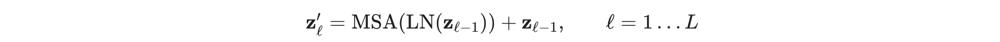

즉, 1부터 L(레이어의 총 개수)까지의 모든 레이어에 대해 레이어노름 레이어(LN)를 감싸는 다중 헤드 어텐션 레이어(MSA)가 있습니다.

끝에 추가되는 것은 출력에 입력을 추가하고 건너뛰기/잔여 연결을 형성하는 것과 같습니다.

이 레이어를 "MSA 블록"이라고 부르겠습니다. 

코드로는 다음과 같이 보일 수 있습니다:

x_output_MSA_block = MSA_layer(LN_layer(x_input)) + x_input

3.2.5 Equation 3 overview

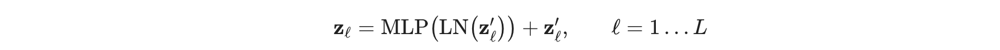

이는 1부터 L(총 레이어 수)까지의 모든 레이어에 대해 레이어노름 레이어(LN)를 감싸는 다층 퍼셉트론 레이어(MLP)가 있다는 것을 의미합니다.

끝에 추가된 것은 skip/residual 연결의 존재를 나타냅니다.

이 레이어를 "MLP 블록"이라고 부르겠습니다.

코드로는 다음과 같이 보일 수 있습니다:

```
x_output_MLP_block = MLP_layer(LN_layer(x_output_MSA_block)) + x_output_MSA_block
```

끝에 있는 skip 연결(레이어의 입력을 레이어의 출력에 추가)에 주목하세요.

3.2.6 Equation 4 overview

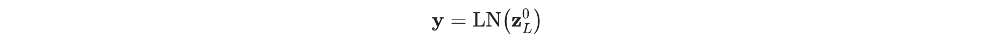

마지막 레이어 L의 경우 출력 y는 LayerNorm 레이어(LN)로 래핑된 z의 0 인덱스 토큰입니다.(0번쨰 인덱스 토큰 값)

또는 우리의 경우 x_output_MLP_block의 0번째 인덱스입니다:

y = Linear_layer(LN_layer(x_output_MLP_block[0]))

물론 위에 몇 가지 단순화된 부분이 있지만 각 섹션에 대한 PyTorch 코드를 작성하기 시작할 때 처리하겠습니다.

참고: 위 섹션은 많은 정보를 다루고 있습니다. 하지만 이해가 되지 않는 부분이 있다면 언제든지 더 조사해볼 수 있다는 것을 잊지 마세요. "잔여 연결이란 무엇인가?"와 같은 질문을 해보세요.

3.2.7 Exploring Table 1

ViT 아키텍처 퍼즐의 마지막 조각은 표 1입니다.

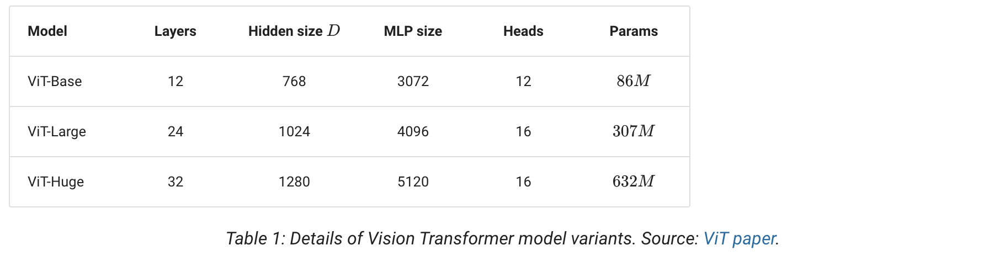

우리는 사이즈가 작은 ViT-Base를 구현할 것이다.

위 테이블에서 각항목이 나타내는 것을 살펴보자.(디코더는 안쓰는 듯)  
- Layers : 인코더 블럭의 수. 각 레이어는 MSA, MLP를 포함한다.
- Hidden size D : 아키텍처의 임베딩 차원이다. 즉 이미지가 패치되어 임베드될 때 이미지가 변환되는 벡터의 크기이다. 일반적으로 임베딩 차원이 클수록 더 많은 정보를 캡쳐할 수있고 더 좋은 결과를 얻을 수 있다. 그러나 임베딩 크기가 크면 더 많은 컴퓨팅 비용이 발생한다.
- MLP size : MLP 레이어에서 히든 유니트의 수
- Heads : 멀티헤드어텐션 레이어에서 히든 레이어의 수
- Params : 모델 파라미터수. ViT-Base 임에도 이전에 본 다른 모델에 비해서 매우 큰 것을 알수있다.

### 4. Equation 1: Split data into patches and creating the class, position and patch embedding

제 머신 러닝 엔지니어 친구 중 한 명이 "임베딩이 전부"이라고 말하곤 했던 것이 기억납니다.

즉, 데이터를 학습 가능한 방식으로 잘 표현할 수 있다면(임베딩은 학습 가능한 표현이므로) 학습 알고리즘이 잘 작동할 가능성이 높다는 뜻입니다.

이제 ViT 아키텍처를 위한 클래스, 위치 및 패치 임베딩을 만드는 것부터 시작하겠습니다.
패치 임베딩부터 시작하겠습니다.

즉, 입력 이미지를 일련의 패치로 전환한 다음 해당 패치를 임베딩할 것입니다.
임베딩은 어떤 형태의 학습 가능한 표현이며 종종 벡터라는 점을 기억하세요.
학습 가능하다는 용어가 중요한 이유는 입력 이미지의 수치적 표현(모델이 보는)이 시간이 지남에 따라 개선될 수 있다는 것을 의미하기 때문입니다.

ViT 백서의 3.1절(굵은 글씨로 표시된 부분)의 첫 문단부터 살펴보겠습니다:

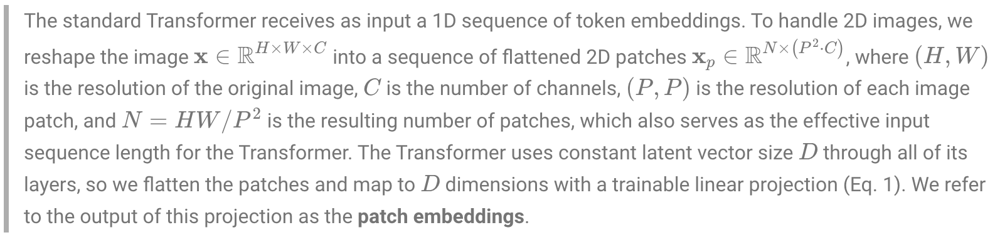

표준 트랜스포머는 토큰 임베딩의 1D 시퀀스를 입력으로 받습니다. 2D 이미지를 다루기 위해, 원본 이미지 X (R_HWC)를 flatten된 2D 패치들의 시퀀스 Xp (R_Nx(P^2C))로 변환한다, $C$는 채널 수, $(P, P)$ 는 각 이미지 패치의 해상도, and $N=H W / P^2$ 는 패치수이며, 트랜스포머 입력 길이에 영향을 미친다. 트랜스포머는 모든 레이어에서 일정한 latent 벡터 크기 $D$를 사용하므로, 패치를 평평하게 하고 훈련 가능한 선형 투영을 사용하여 $D$ 차원으로 매핑합니다(방정식 1). 이 투영의 출력을 패치 임베딩이라고 합니다.

그리고 테이블 3에서 training resolution은 224라고 명시되어 있다.

-----여기까지 ------------------------------

이제 위 내용을 정리하자.  
- D는 패치 임베딩인데 모델마다 다르다.  
- 이미지 사이즈는 H, W, C  
- 이미지는 2D 패치의 시퀀스로 변환되는데 사이즈는 N * N* $P^2$ C 이다.  
- P, P는 이미지 패치의 레졸류션이다.  
- N = HW /P^2는 패치의 수이다. 입력 시퀀스의 길이가 된다.

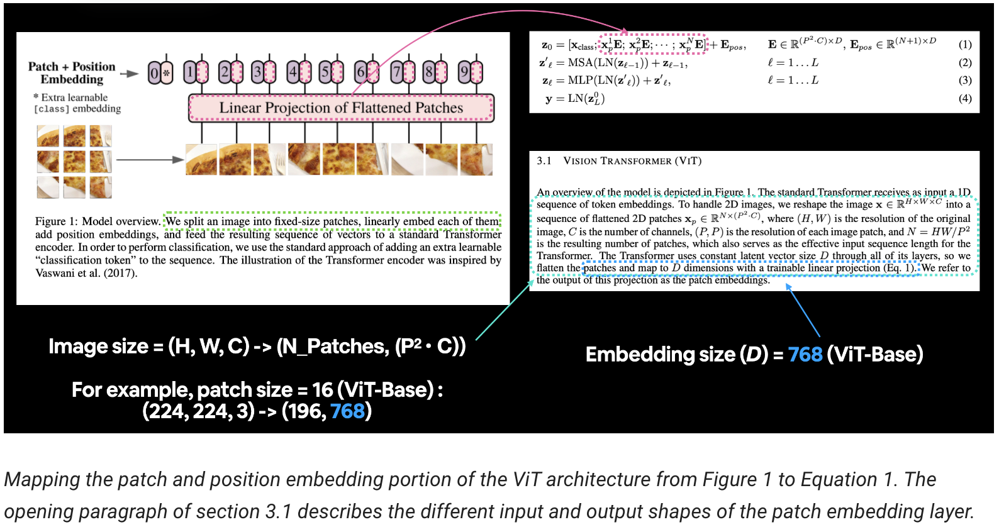

Calculating patch embedding input and output shapes by hand

이 값들을 순으로 계산해보자.  
vit-base는 p=16의 사이즈를 사용한다.

In [14]:
height = 224 
width = 224
color_channels = 3
patch_size = 16

In [15]:
# Calculate N (number of patches)
number_of_patches = int((height * width) / patch_size**2)
print(f"Number of patches (N) with image height (H={height}), width (W={width}) and patch size (P={patch_size}): {number_of_patches}")

Number of patches (N) with image height (H=224), width (W=224) and patch size (P=16): 196


임베딩 레이어로 변환해보는 실습??

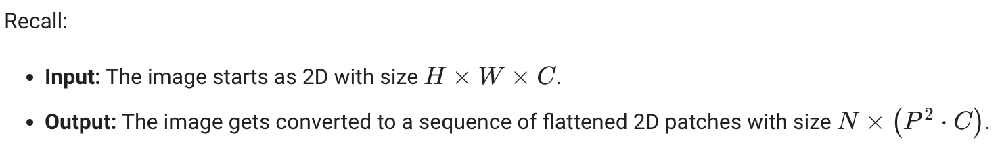

In [16]:
embedding_layer_input_shape = (height, width, color_channels)

embedding_layer_output_shape = (number_of_patches, patch_size**2*color_channels)


print(f"Input shape (single 2D image): {embedding_layer_input_shape}")
print(f"Output shape (single 2D image flattened into patches): {embedding_layer_output_shape}")

Input shape (single 2D image): (224, 224, 3)
Output shape (single 2D image flattened into patches): (196, 768)



Turning a single image into patches

In [17]:
image.shape

torch.Size([3, 224, 224])

(-0.5, 223.5, 223.5, -0.5)

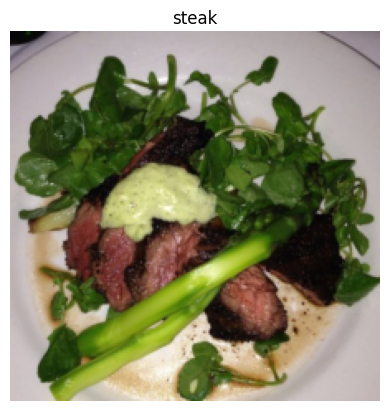

In [18]:
plt.imshow(image.permute(1, 2, 0))
plt.title(class_names[label])
plt.axis(False)

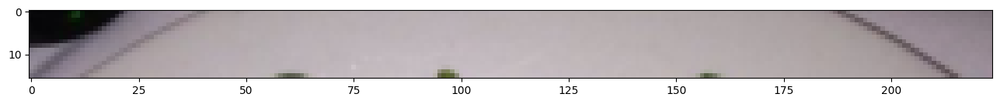

In [19]:
image_permuted = image.permute(1, 2, 0)

patch_size = 16
plt.figure(figsize = (patch_size, patch_size))
plt.imshow(image_permuted[:patch_size, :, :])

이제 이 첫번째 row를 패치로 쪼개본다.

Number of patches per row: 14.0
Patch size: 16 pixels x 16 pixels


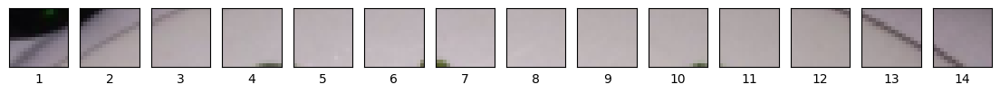

In [20]:
img_size = 224
patch_size = 16
num_patches = img_size / patch_size

assert img_size % patch_size == 0, "Image size must be divisible by patch size"
print(f"Number of patches per row: {num_patches}\nPatch size: {patch_size} pixels x {patch_size} pixels")

fig, axs = plt.subplots(nrows = 1,
                        ncols = img_size // patch_size,
                        figsize = (num_patches, num_patches),
                        sharex = True,
                        sharey = True)

for i, patch in enumerate(range(0, img_size, patch_size)):
    axs[i].imshow(image_permuted[: patch_size, patch: patch+patch_size, :]);
    axs[i].set_xlabel(i + 1)
    axs[i].set_xticks([])
    axs[i].set_yticks([])

Number of patches per row: 14.0        
Number of patches per column: 14.0        
Total patches: 196.0        
Patch size: 16 pixels x 16 pixels


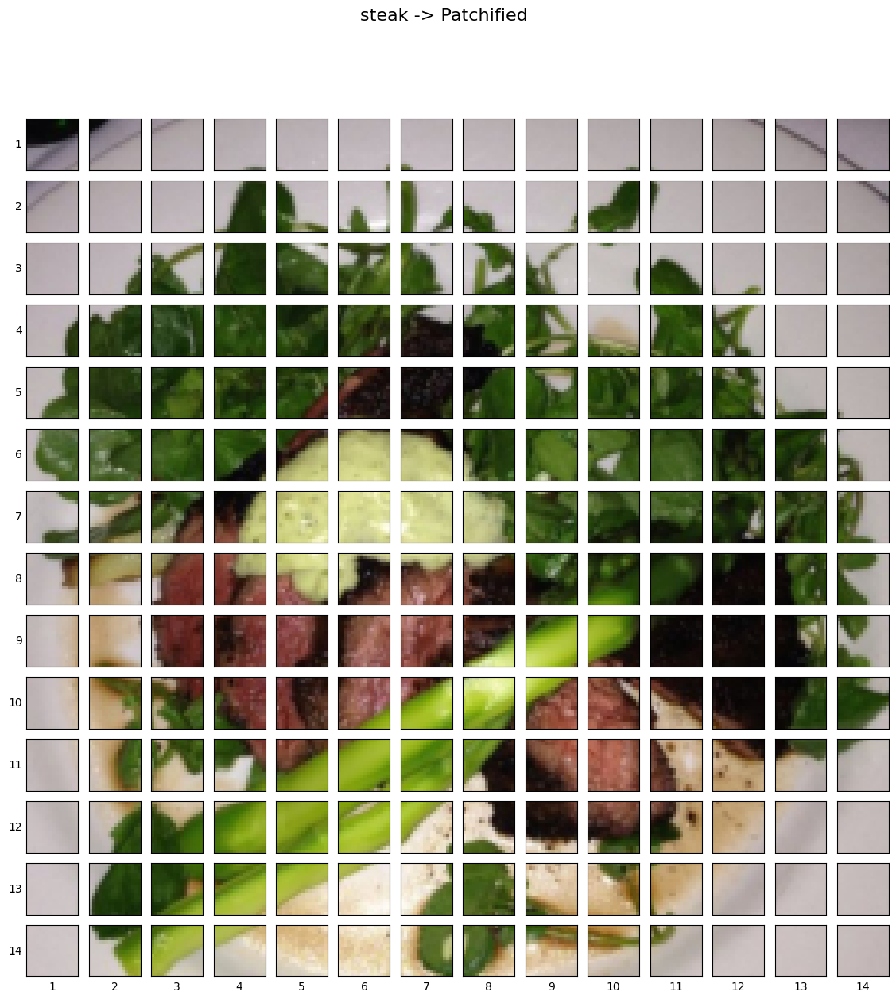

In [21]:
# Setup hyperparameters and make sure img_size and patch_size are compatible
img_size = 224
patch_size = 16
num_patches = img_size/patch_size 
assert img_size % patch_size == 0, "Image size must be divisible by patch size" 
print(f"Number of patches per row: {num_patches}\
        \nNumber of patches per column: {num_patches}\
        \nTotal patches: {num_patches*num_patches}\
        \nPatch size: {patch_size} pixels x {patch_size} pixels")

# Create a series of subplots
fig, axs = plt.subplots(nrows=img_size // patch_size, # need int not float
                        ncols=img_size // patch_size, 
                        figsize=(num_patches, num_patches),
                        sharex=True,
                        sharey=True)

# Loop through height and width of image
for i, patch_height in enumerate(range(0, img_size, patch_size)): # iterate through height
    for j, patch_width in enumerate(range(0, img_size, patch_size)): # iterate through width
        
        # Plot the permuted image patch (image_permuted -> (Height, Width, Color Channels))
        axs[i, j].imshow(image_permuted[patch_height:patch_height+patch_size, # iterate through height 
                                        patch_width:patch_width+patch_size, # iterate through width
                                        :]) # get all color channels
        
        # Set up label information, remove the ticks for clarity and set labels to outside
        axs[i, j].set_ylabel(i+1, 
                             rotation="horizontal", 
                             horizontalalignment="right", 
                             verticalalignment="center") 
        axs[i, j].set_xlabel(j+1) 
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])
        axs[i, j].label_outer()

# Set a super title
fig.suptitle(f"{class_names[label]} -> Patchified", fontsize=16)
plt.show()

Creating image patches with torch.nn.Conv2d()

이제 파이토치로 패치 임베딩 레이어를 복제한다.  
단일 이미지를 시각하기 위해 다양한 높이와 너비 치수를 반복하고 개별 패치를 플로팅하는 코드를 작생했다.  
이 것은 앞의 컨벌루션 연산과 유사하다.

실제로 본 논문의 저자는 cnn으로 패치 임베딩을 수행할 수 있다고 언급했다.

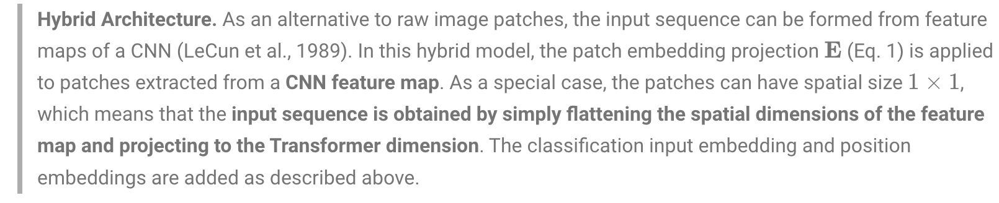

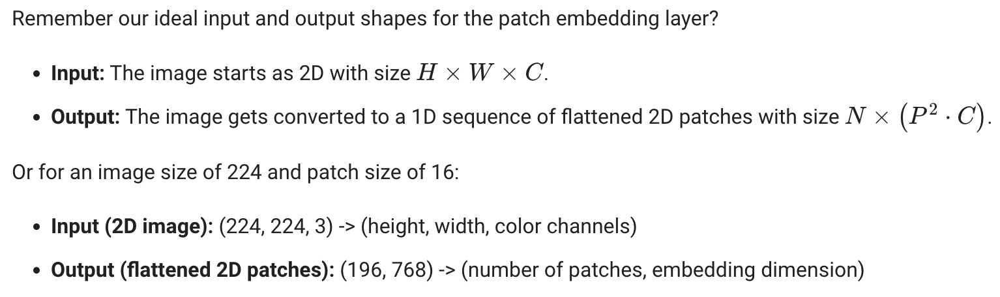

우리는 패치를 만들기 위해 kernel_size, stride를 patch_size로 둘수가 있다.  

다사 말해 커널 사이즈를 (patch_size x patch_size), 즉 16 x 16으로 둘수 있다.  

채널이 3이므로 out_channels = 768이다.  

이것은 테이블 1의 ViT-Base의 D 값과 같다.

In [22]:
from torch import nn

patch_size = 16

conv2d = nn.Conv2d(in_channels=3,
                   out_channels=768,
                   kernel_size=patch_size,
                   stride=patch_size,
                   padding=0)

(-0.5, 223.5, 223.5, -0.5)

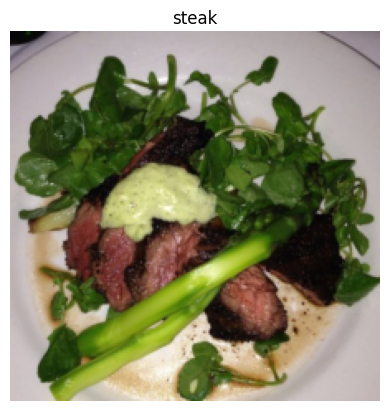

In [23]:
plt.imshow(image.permute(1, 2, 0))
plt.title(class_names[label])
plt.axis(False)

In [24]:
image.shape

torch.Size([3, 224, 224])

In [25]:
image_out_of_conv = conv2d(image.unsqueeze(0))
print(image_out_of_conv.shape)

torch.Size([1, 768, 14, 14])


torch.Size([1, 768, 14, 14]) -> [batch_size, embedding_dim, feature_map_height, feature_map_width]

5개의 랜덤 피처를 시각화해보자.

Showing random convolutional feature maps from indexes: [518, 565, 709, 1, 744]


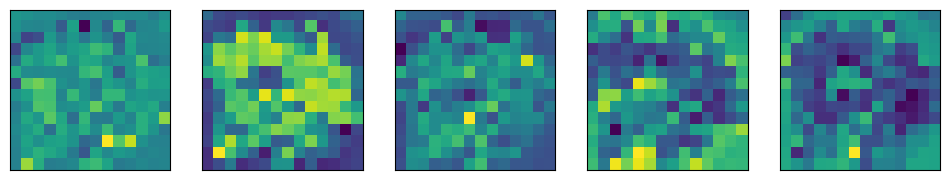

In [26]:
# Plot random 5 convolutional feature maps
import random
random_indexes = random.sample(range(0, 758), k=5) # pick 5 numbers between 0 and the embedding size
print(f"Showing random convolutional feature maps from indexes: {random_indexes}")

# Create plot
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(12, 12))

# Plot random image feature maps
for i, idx in enumerate(random_indexes):
    image_conv_feature_map = image_out_of_conv[:, idx, :, :] # index on the output tensor of the convolutional layer
    axs[i].imshow(image_conv_feature_map.squeeze().detach().numpy())
    axs[i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[]);

피처 맵이 원본 이미지를 어떻게 표현하는지 살펴보고, 몇 번 더 시각화하면 다양한 주요 윤곽선과 몇 가지 주요 특징을 볼 수 있습니다.

주의해야 할 점은 신경망이 학습함에 따라 이러한 특징이 시간이 지남에 따라 바뀔 수 있다는 것입니다.

따라서 이러한 특징 맵은 학습 가능한 이미지 임베딩으로 간주할 수 있습니다.

한 가지를 수치로 확인해 보겠습니다.

In [27]:
# Get a single feature map in tensor form
single_feature_map = image_out_of_conv[:, 0, :, :]
single_feature_map, single_feature_map.requires_grad

(tensor([[[ 0.2496,  0.2555,  0.1632,  0.1780,  0.1581,  0.1510,  0.1999,
            0.1456,  0.1372,  0.1739,  0.1417,  0.1215,  0.0548,  0.0948],
          [ 0.1500,  0.1384,  0.1541, -0.1043, -0.0705,  0.0521,  0.2040,
           -0.1416,  0.2015, -0.2376,  0.0745,  0.1321,  0.1301,  0.1614],
          [ 0.1431,  0.3073, -0.1278, -0.0046, -0.0559,  0.0127, -0.1843,
            0.1323, -0.0367,  0.2510, -0.1595,  0.1666,  0.1337,  0.1228],
          [ 0.2161, -0.2746,  0.0201, -0.0154,  0.0568, -0.0780, -0.0086,
           -0.2000,  0.1767, -0.0365, -0.0190, -0.0440,  0.1299,  0.1222],
          [-0.0318, -0.0041, -0.0321, -0.0697, -0.0690, -0.0845, -0.0188,
            0.1293, -0.1422, -0.0937, -0.0450, -0.1540,  0.0939,  0.1589],
          [-0.0181, -0.0485, -0.0392, -0.0337,  0.0266,  0.0484,  0.2532,
           -0.0275,  0.0277,  0.0110,  0.0186,  0.0154, -0.0347, -0.0339],
          [ 0.0346,  0.0709,  0.0904,  0.0683, -0.0367, -0.0067,  0.0662,
            0.1233, -0.0511, -0.

single_feature_map의  grad_fn과 requires_grad = True이다.  
학습이 가능하다는 뜻이다. 

Flattening the patch embedding with torch.nn.Flatten()

이미지를 패치 임베딩으로 전환했지만 여전히 2D 형식입니다.

ViT 모델의 패치 임베딩 레이어에서 원하는 출력 모양으로 변환하려면 어떻게 해야 할까요?

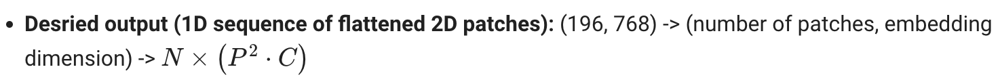

현재 shape를 확인해보자.

In [28]:
# Current tensor shape
print(f"Current tensor shape: {image_out_of_conv.shape} -> [batch, embedding_dim, feature_map_height, feature_map_width]")

Current tensor shape: torch.Size([1, 768, 14, 14]) -> [batch, embedding_dim, feature_map_height, feature_map_width]


768개 파트는 얻었지만 패치수 N이 필요하다.  
 입력 시퀀스는 단순히 피처 맵의 공간 차원을 평평하게 하고 트랜스포머 차원으로 투영하여 얻을 수 있습니다.

파이토치의 Flatten()을 사용하면 될까?  
그러나 우리는 전체 텐서를 flatten하도록 원하는 것이 아니고, feature map의 spatial dimension만 flatten하고자 한다.   

따라사 start_dim, end_dim을 지정하면 된다.

In [29]:
# Create flatten layer
flatten = nn.Flatten(start_dim=2, # flatten feature_map_height (dimension 2)
                     end_dim=3) # flatten feature_map_width (dimension 3)

이 모든 것을 한번에 진행해보자.

Original image shape: torch.Size([3, 224, 224])
Image feature map shape: torch.Size([1, 768, 14, 14])
Flattened image feature map shape: torch.Size([1, 768, 196])


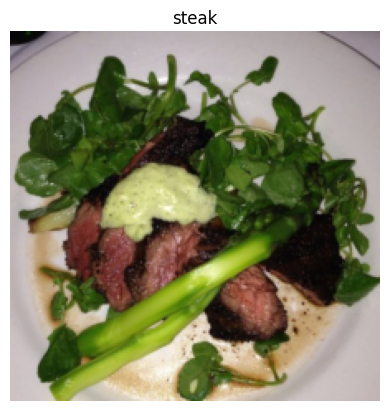

In [30]:
# 1. View single image
plt.imshow(image.permute(1, 2, 0)) # adjust for matplotlib
plt.title(class_names[label])
plt.axis(False);
print(f"Original image shape: {image.shape}")

# 2. Turn image into feature maps
image_out_of_conv = conv2d(image.unsqueeze(0)) # add batch dimension to avoid shape errors
print(f"Image feature map shape: {image_out_of_conv.shape}")

# 3. Flatten the feature maps
image_out_of_conv_flattened = flatten(image_out_of_conv)
print(f"Flattened image feature map shape: {image_out_of_conv_flattened.shape}")

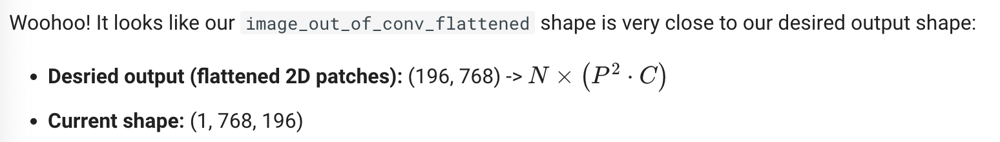

약간의 차이가 있다. 어떻게 수정할까.   
permute 메서드를 사용하면 된다.

In [31]:
# Get flattened image patch embeddings in right shape 
image_out_of_conv_flattened_reshaped = image_out_of_conv_flattened.permute(0, 2, 1) # [batch_size, P^2•C, N] -> [batch_size, N, P^2•C]
print(f"Patch embedding sequence shape: {image_out_of_conv_flattened_reshaped.shape} -> [batch_size, num_patches, embedding_size]")

Patch embedding sequence shape: torch.Size([1, 196, 768]) -> [batch_size, num_patches, embedding_size]


이제 flatten된 것을 시각화 해보자.

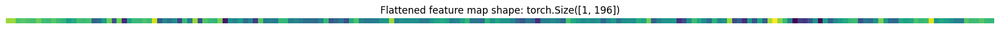

In [32]:
# Get a single flattened feature map
single_flattened_feature_map = image_out_of_conv_flattened_reshaped[:, :, 0] # index: (batch_size, number_of_patches, embedding_dimension)

# Plot the flattened feature map visually
plt.figure(figsize=(22, 22))
plt.imshow(single_flattened_feature_map.detach().numpy())
plt.title(f"Flattened feature map shape: {single_flattened_feature_map.shape}")
plt.axis(False);

In [33]:
# See the flattened feature map as a tensor
single_flattened_feature_map, single_flattened_feature_map.requires_grad, single_flattened_feature_map.shape

(tensor([[ 0.2496,  0.2555,  0.1632,  0.1780,  0.1581,  0.1510,  0.1999,  0.1456,
           0.1372,  0.1739,  0.1417,  0.1215,  0.0548,  0.0948,  0.1500,  0.1384,
           0.1541, -0.1043, -0.0705,  0.0521,  0.2040, -0.1416,  0.2015, -0.2376,
           0.0745,  0.1321,  0.1301,  0.1614,  0.1431,  0.3073, -0.1278, -0.0046,
          -0.0559,  0.0127, -0.1843,  0.1323, -0.0367,  0.2510, -0.1595,  0.1666,
           0.1337,  0.1228,  0.2161, -0.2746,  0.0201, -0.0154,  0.0568, -0.0780,
          -0.0086, -0.2000,  0.1767, -0.0365, -0.0190, -0.0440,  0.1299,  0.1222,
          -0.0318, -0.0041, -0.0321, -0.0697, -0.0690, -0.0845, -0.0188,  0.1293,
          -0.1422, -0.0937, -0.0450, -0.1540,  0.0939,  0.1589, -0.0181, -0.0485,
          -0.0392, -0.0337,  0.0266,  0.0484,  0.2532, -0.0275,  0.0277,  0.0110,
           0.0186,  0.0154, -0.0347, -0.0339,  0.0346,  0.0709,  0.0904,  0.0683,
          -0.0367, -0.0067,  0.0662,  0.1233, -0.0511, -0.0545, -0.0779,  0.1128,
           0.022

Turning the ViT patch embedding layer into a PyTorch module  
구현 순서는 다음과 같다.  
- 1. `PatchEmbedding` 클래스를 생성하고 nn.Module을 서브 클래싱
- 2. Vit-Base를 위해 in_channels = 3, patch_size=16으로 초기화. 그리고 embedding_dim = 768(Table.1의 D)
- 3. 이미지를 패치로 만드는 nn.Conv2d()레이어 추가(4.3에 설명한 것)
- 4. 패치를 flatten해서 단일 dimension을 만드는 레이어 생성(4.4에 설명한 것)
- 5. forward() 메서드 정의
- 6. output shape 지정( $N*(P^2C)$)

In [34]:
# 1. Create a class which subclasses nn.Module
class PatchEmbedding(nn.Module):
    """Turns a 2D input image into a 1D sequence learnable embedding vector.
    
    Args:
        in_channels (int): Number of color channels for the input images. Defaults to 3.
        patch_size (int): Size of patches to convert input image into. Defaults to 16.
        embedding_dim (int): Size of embedding to turn image into. Defaults to 768.
    """ 
    # 2. Initialize the class with appropriate variables
    def __init__(self, 
                 in_channels:int=3,
                 patch_size:int=16,
                 embedding_dim:int=768):
        super().__init__()
        
        # 3. Create a layer to turn an image into patches
        self.patcher = nn.Conv2d(in_channels=in_channels,
                                 out_channels=embedding_dim,
                                 kernel_size=patch_size,
                                 stride=patch_size,
                                 padding=0)
        
        # 4. 패치를 flatten해서 단일 dimention으로 만듬
        self.flatten = nn.Flatten( # 확인요
            start_dim=2, # 배치는 유지해야 하므로..
            end_dim=3
        )
        
    def forward(self, x):
        # 입력이 제대로된 shape인지 ㄴ체크하는 assertion 생성
        image_resolution = x.shape[-1]
        assert image_resolution % patch_size == 0, f"Input image size must be divisble by patch size, image shape: {image_resolution}, patch size: {patch_size}"
        
        x_patched = self.patcher(x)
        x_flattened = self.flatten(x_patched)
        
        # 6. 출력 shape순서 설정
        # [batch_size, P^2•C, N] -> [batch_size, N, P^2•C]
        return x_flattened.permute(0, 2, 1)

단일 이미지에 대해서 진행해본다.

In [35]:
set_seeds()

# 패치 임베딩 레잉어 생성
patchify = PatchEmbedding(in_channels=3,
                          patch_size=16,
                          embedding_dim=768)

print(f"Input image shape: {image.unsqueeze(0).shape}")
patch_embedded_image = patchify(image.unsqueeze(0))
print(f"Output patch embedding shape: {patch_embedded_image.shape}")

Input image shape: torch.Size([1, 3, 224, 224])
Output patch embedding shape: torch.Size([1, 196, 768])


- 입력 : H, W, C 사이즈의 2D 데이터
- 출력 : flattened 된 1D sequence

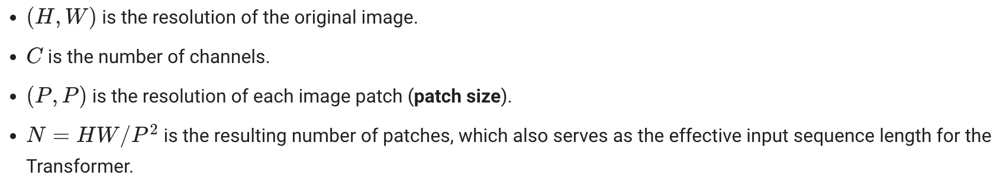

지금까지 equation 1의 패치 임베딩을 구현해봤다.  
하지만 아직 토큰/포지션 임베딩이 아니다.

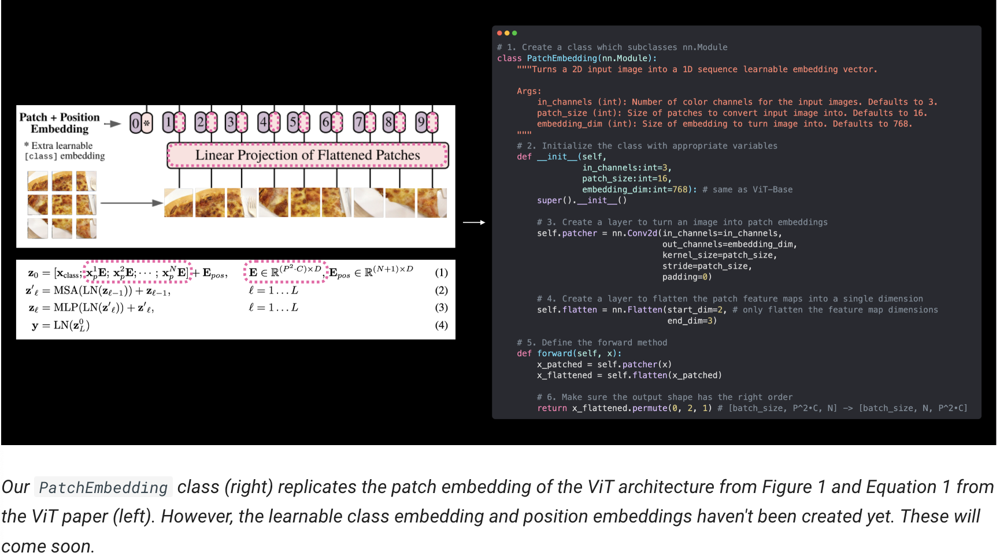

마지막으로 랜덤 데이터를 입력해서 서머리 테스트를 해보자.

In [36]:
# Create random input sizes
random_input_image = (1, 3, 224, 224)
random_input_image_error = (1, 3, 250, 250) # will error because image size is incompatible with patch_size

# Get a summary of the input and outputs of PatchEmbedding (uncomment for full output)
summary(PatchEmbedding(), 
        input_size=random_input_image, # try swapping this for "random_input_image_error" 
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"])

/Users/sguys99/opt/anaconda3/envs/torch/lib/python3.9/site-packages/torchinfo/torchinfo.py:477: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  action_fn=lambda data: sys.getsizeof(data.storage()),


Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
PatchEmbedding (PatchEmbedding)          [1, 3, 224, 224]     [1, 196, 768]        --                   True
├─Conv2d (patcher)                       [1, 3, 224, 224]     [1, 768, 14, 14]     590,592              True
├─Flatten (flatten)                      [1, 768, 14, 14]     [1, 768, 196]        --                   --
Total params: 590,592
Trainable params: 590,592
Non-trainable params: 0
Total mult-adds (M): 115.76
Input size (MB): 0.60
Forward/backward pass size (MB): 1.20
Params size (MB): 2.36
Estimated Total Size (MB): 4.17

Creating the class token embedding

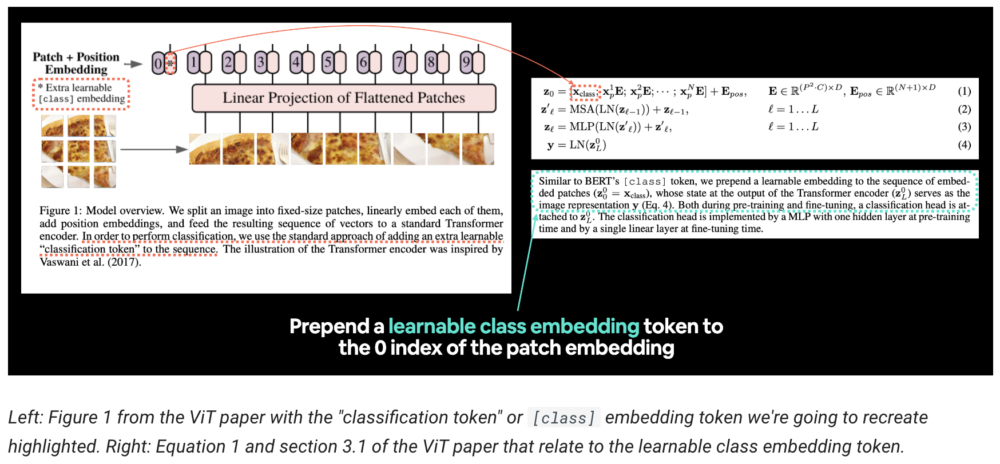

논문의 3.1에 다음과 같은 내용이 나온다.

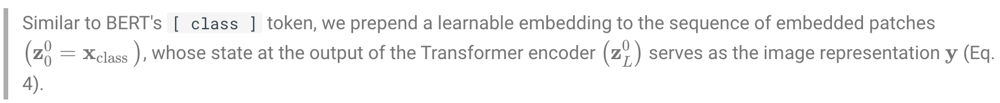

버트의 class 토큰과 비슷하게, 학습 가능한 임베딩을 앞에 추가한다. 여기서 z0 = xclass...??

- 참고 : 버트는 시퀀스 시작 부분에 [ class ] 토큰을 갖는다는 아이디어가 시작된 곳이며, 여기서 class는 시퀀스가 속하는 '분류' 클래스에 대한 설명이다.

따라서 임베드된 패치의 시퀀스에 learnable embedding을 추가한다.   
먼저 앞에서 테스트한 페치 시퀀스를 살펴보자.

In [37]:
print(patch_embedded_image)

tensor([[[-0.2849,  0.0057, -0.3357,  ...,  0.2284,  0.0687,  0.2527],
         [-0.7305,  0.2798, -0.2547,  ...,  0.4708, -0.1476,  0.1996],
         [-0.7338,  0.2091, -0.2212,  ...,  0.5102, -0.2611,  0.2414],
         ...,
         [-0.8091,  0.2240, -0.2416,  ...,  0.5897, -0.3285,  0.2703],
         [-0.7999,  0.1991, -0.2170,  ...,  0.5909, -0.3696,  0.2897],
         [-0.7680,  0.1843, -0.2114,  ...,  0.5746, -0.3545,  0.2828]]],
       grad_fn=<PermuteBackward0>)


In [38]:
print(f"Patch embedding shape: {patch_embedded_image.shape} -> [batch_size, number_of_patches, embedding_dimension]")

Patch embedding shape: torch.Size([1, 196, 768]) -> [batch_size, number_of_patches, embedding_dimension]


learnable embedding을 부착하기 위해 embedding_dimension (D) shape의 임베딩을  생성하고,  
number_of_patches dimension에 추가한다.

pseudoecode로 설명하면  
```python
patch_embedding = [image_patch_1, image_patch_2, image_patch_3...]
class_token = learnable_embedding
patch_embedding_with_class_token = torch.cat((class_token, patch_embedding), dim=1)
```

torch.cat()를 사용하면 dim = 1, number_of_patches 차원에 연결한다..

이를 위해 배치 크기와 임베딩 차원 모양을 가져온 다음, [batch_size, 1, embedding_dimension] 모양으로 torch.ones() 텐서를 생성합니다.   
그리고 learnable 텐서를 사용하기 때문에. nn.Parameter()에 통과시킨다.

In [39]:
patch_embedded_image.shape

torch.Size([1, 196, 768])

In [40]:
batch_size = patch_embedded_image.shape[0]
embedding_dimension = patch_embedded_image.shape[-1]


class_token = nn.Parameter(data = torch.ones(batch_size, 1, embedding_dimension),
                           requires_grad=True
                           )

print(class_token[:, :, :10])

tensor([[[1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]]], grad_fn=<SliceBackward0>)


In [41]:
# Print the class_token shape
print(f"Class token shape: {class_token.shape} -> [batch_size, number_of_tokens, embedding_dimension]")

Class token shape: torch.Size([1, 1, 768]) -> [batch_size, number_of_tokens, embedding_dimension]


- 참고 : 여기서는 데모 목적으로 클래스 토큰 임베딩을 torch.ones()로 생성했지만 실제로는 torch.randn()으로 클래스 토큰 임베딩을 생성할 가능성이 높습니다(머신러닝은 제어된 무작위성의 힘을 활용하는 것이므로 일반적으로 임의의 숫자로 시작하여 시간이 지남에 따라 개선해 나가게 됩니다).

패치 임베딩 시퀀스의 시작 부분에 하나의 클래스 토큰 값만 추가하고 싶기 때문에 class_token의 number_of_tokens 차원이 1인 이유를 확인하세요.   
이제 torch.cat()을 사용하여 dim=1을 설정하면 됩니다(따라서 class_token의 number_of_tokens 차원이 patch_embedded_image의 number_of_patches 차원에 추가됩니다).

In [42]:
patch_embedded_image_with_class_embedding = torch.cat((class_token, patch_embedded_image),
                                                      dim = 1
                                                      )

print(patch_embedded_image_with_class_embedding)

tensor([[[ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
         [-0.2849,  0.0057, -0.3357,  ...,  0.2284,  0.0687,  0.2527],
         [-0.7305,  0.2798, -0.2547,  ...,  0.4708, -0.1476,  0.1996],
         ...,
         [-0.8091,  0.2240, -0.2416,  ...,  0.5897, -0.3285,  0.2703],
         [-0.7999,  0.1991, -0.2170,  ...,  0.5909, -0.3696,  0.2897],
         [-0.7680,  0.1843, -0.2114,  ...,  0.5746, -0.3545,  0.2828]]],
       grad_fn=<CatBackward0>)


In [43]:
print(f"Sequence of patch embeddings with class token prepended shape: {patch_embedded_image_with_class_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

Sequence of patch embeddings with class token prepended shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


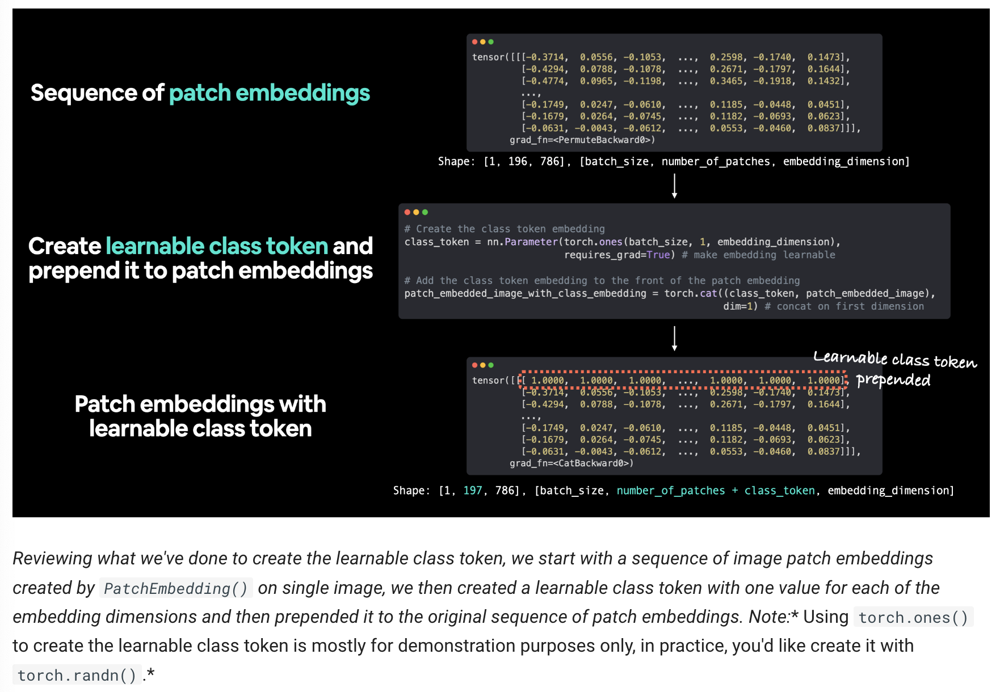

Creating the position embedding

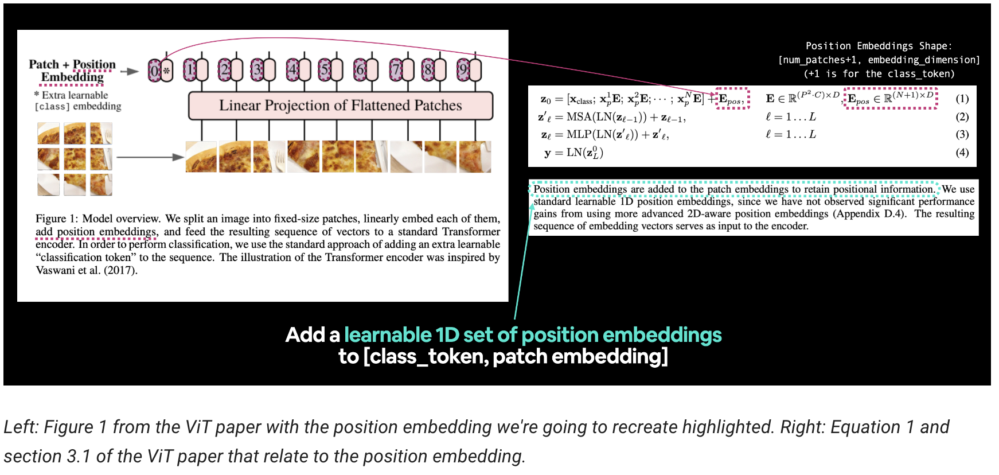

눈문의 section 3.1을 살펴보자.

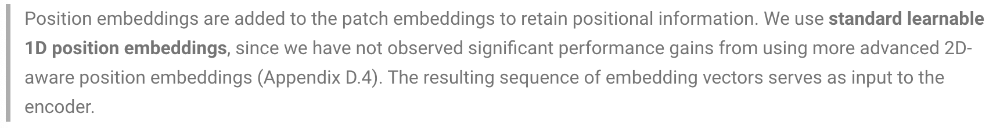

위치정보를 사용한다는 것은 패치가 어떤 순서로 적용되는지 알기를 원한다는 의미이다.


우선 현재 임베딩을 살펴보자.

In [44]:
patch_embedded_image_with_class_embedding

tensor([[[ 1.0000,  1.0000,  1.0000,  ...,  1.0000,  1.0000,  1.0000],
         [-0.2849,  0.0057, -0.3357,  ...,  0.2284,  0.0687,  0.2527],
         [-0.7305,  0.2798, -0.2547,  ...,  0.4708, -0.1476,  0.1996],
         ...,
         [-0.8091,  0.2240, -0.2416,  ...,  0.5897, -0.3285,  0.2703],
         [-0.7999,  0.1991, -0.2170,  ...,  0.5909, -0.3696,  0.2897],
         [-0.7680,  0.1843, -0.2114,  ...,  0.5746, -0.3545,  0.2828]]],
       grad_fn=<CatBackward0>)

In [45]:
patch_embedded_image_with_class_embedding.shape

torch.Size([1, 197, 768])

포지션 임베딩 $E_pos$는 (N +1) x D shape를 가져햐한다.

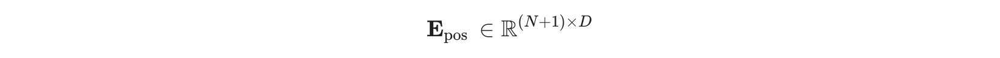

여기서 
- $N = HW/P^2$는 트랜스포머의 입력 시퀀스 길이에 해당하는 패치의 수이다.
- D는 패치 임베딩 사이즈이다.

이제 torch.ones()를 사용해서 학습 가능한 1D 임베딩 $E_pos$를 만들어보자.

In [46]:
height, width, patch_size

(224, 224, 16)

In [47]:
# N : number of patches 계산하기
number_of_patches = int((height * width) / patch_size**2)

# embedding dimension 구하기
embedding_dimension = patch_embedded_image_with_class_embedding.shape[2]

position_embedding = nn.Parameter(torch.ones(1,
                                             number_of_patches+1,
                                             embedding_dimension
                                             ),
                                  requires_grad=True)

In [48]:
print(f"Position embeddding shape: {position_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

Position embeddding shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


- 참고 : 데모를 위해 위치 임베딩을 torch.ones()로 만들었을 뿐, 실제로는 torch.randn()으로 위치 임베딩을 만들 것입니다(임의의 숫자로 시작하여 경사 하강을 통해 개선).

In [49]:
# Add the position embedding to the patch and class token embedding
patch_and_position_embedding = patch_embedded_image_with_class_embedding + position_embedding
# print(patch_and_position_embedding)
print(f"Patch embeddings, class token prepended and positional embeddings added shape: {patch_and_position_embedding.shape} -> [batch_size, number_of_patches, embedding_dimension]")

Patch embeddings, class token prepended and positional embeddings added shape: torch.Size([1, 197, 768]) -> [batch_size, number_of_patches, embedding_dimension]


position embedding의 값 때문에 1씩 증가했다.

- 참고: 원한다면 클래스 토큰 임베딩과 위치 임베딩을 모두 자체 레이어에 넣을 수 있습니다. 하지만 이 두 가지를 전체 ViT 아키텍처의 forward() 메서드에 통합하는 방법은 섹션 8의 뒷부분에서 살펴보겠습니다.

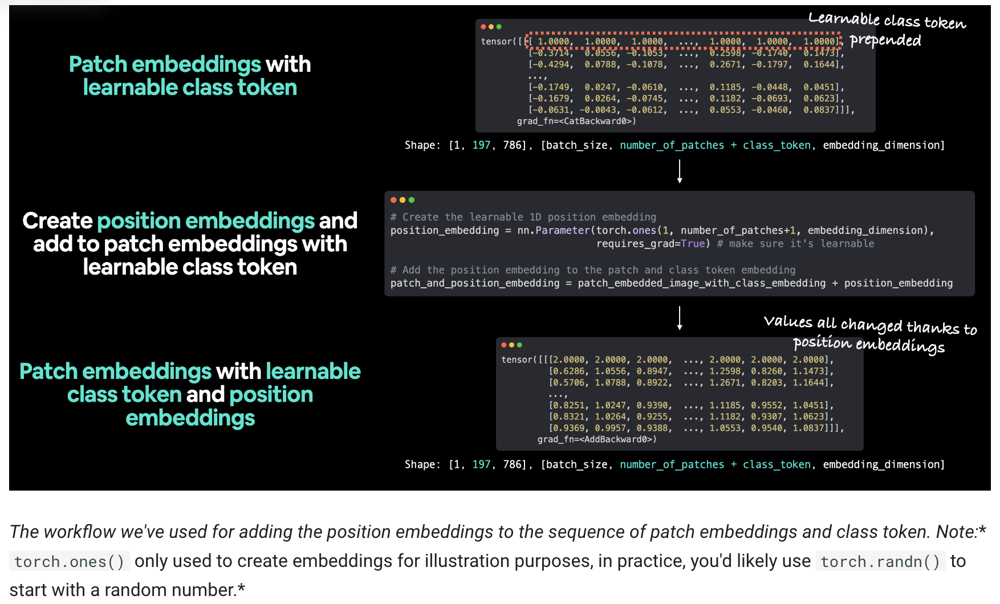

Putting it all together: from image to embedding

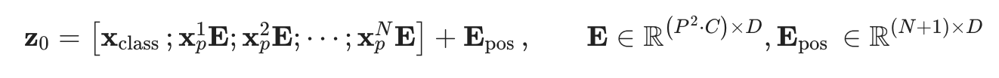

이제 입력 이미지 x와 출력 임베딩 z0 사이의 코드를 한번에 작성해보자.

- 1. Setting the patch size (we'll use 16 as it's widely used throughout the paper and for ViT-Base).
- 2. Getting a single image, printing its shape and storing its height and width.
- 3. Adding a batch dimension to the single image so it's compatible with our PatchEmbedding layer.
- 4. Creating a PatchEmbedding layer (the one we made in section 4.5) with a patch_size=16 and embedding_dim=768 (from Table 1 for ViT-Base).
- 5. Passing the single image through the PatchEmbedding layer in 4 to create a sequence of patch embeddings.
- 6. Creating a class token embedding like in section 4.6.
- 7. Prepending the class token emebdding to the patch embeddings created in step 5.
- 8. Creating a position embedding like in section 4.7.
- 9. Adding the position embedding to the class token and patch embeddings created in step 7.

In [50]:
set_seeds()

# 1. 패치 사이즈
patch_size = 16

# 2. 원본 이미지 shape확인
print(f"Image tensor shape: {image.shape}")
height, width = image.shape[1], image.shape[2]

# 3. 이미지 텐서에 패치 디멘전 추가
x = image.unsqueeze(0)
print(f"Input image with batch dimension shape: {x.shape}")

Image tensor shape: torch.Size([3, 224, 224])
Input image with batch dimension shape: torch.Size([1, 3, 224, 224])


In [51]:
# 4. Create pathch embedding layer
patch_embedding_layer = PatchEmbedding(in_channels=3,
                                       patch_size=patch_size,
                                       embedding_dim=768)

# 5. Pass image through patch embedding layer
patch_embedding = patch_embedding_layer(x)
print(f"Patching embedding shape: {patch_embedding.shape}")

Patching embedding shape: torch.Size([1, 196, 768])


In [52]:
# 6. Create class token embedding
batch_size = patch_embedding.shape[0]
embedding_dimension = patch_embedding.shape[-1]
class_token = nn.Parameter(torch.ones(batch_size, 1, embedding_dimension),
                           requires_grad=True) # make sure it's learnable
print(f"Class token embedding shape: {class_token.shape}")

# 7. Prepend class token embedding to patch embedding
patch_embedding_class_token = torch.cat((class_token, patch_embedding), dim=1)
print(f"Patch embedding with class token shape: {patch_embedding_class_token.shape}")

# 8. Create position embedding
number_of_patches = int((height * width) / patch_size**2)
position_embedding = nn.Parameter(torch.ones(1, number_of_patches+1, embedding_dimension),
                                  requires_grad=True) # make sure it's learnable

# 9. Add position embedding to patch embedding with class token
patch_and_position_embedding = patch_embedding_class_token + position_embedding
print(f"Patch and position embedding shape: {patch_and_position_embedding.shape}")

Class token embedding shape: torch.Size([1, 1, 768])
Patch embedding with class token shape: torch.Size([1, 197, 768])
Patch and position embedding shape: torch.Size([1, 197, 768])


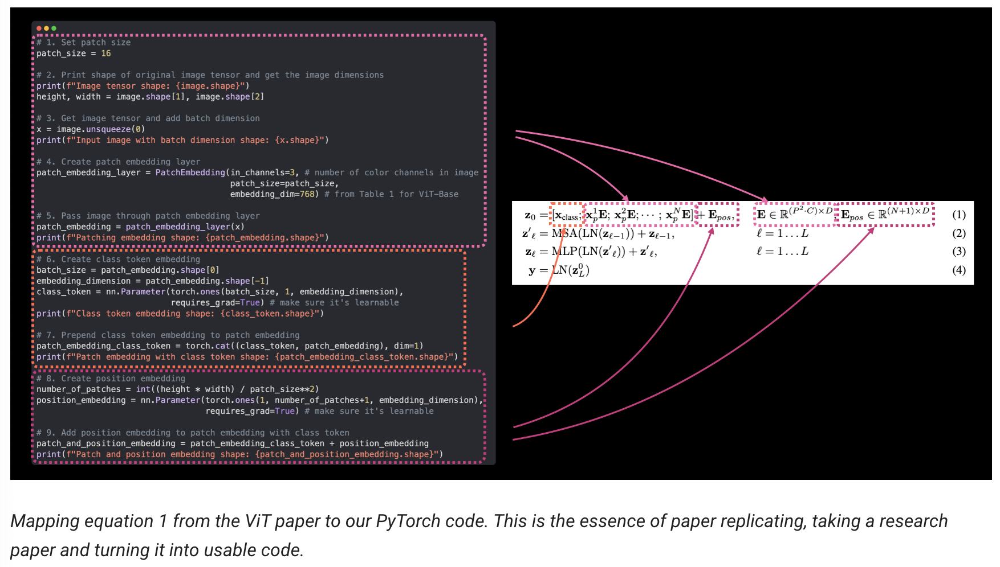

이제 이미지를 인코드하고 트랜스포머 인코더로 주입한다.

ViT paper에서 패치 임베딩이 코드의 가장 많은 부분을 차지한다.  
나머지중에 중요한 부분이 멀티헤드 어텐션과 Norm layer이다.

### 5. Equation 2: Multi-Head Attention (MSA)

입력 데이터를 패치하고 임베드했으니 이제 ViT 아키텍처의 다음 부분으로 넘어가 보겠습니다.

먼저 트랜스포머 인코더 섹션을 두 부분으로 나누겠습니다(작게 시작해서 필요하면 늘려가세요).

첫 번째는 방정식 2이고 두 번째는 방정식 3입니다.

방정식 2 상태를 기억하세요:

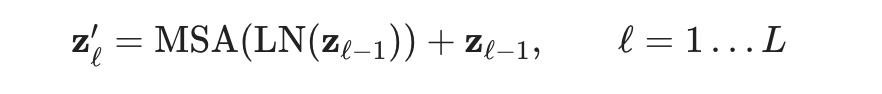

이는 residual connection(레이어에 대한 입력이 레이어의 출력에 추가됨)이 있는 LayerNorm(LN) 레이어로 래핑된 Multi-Head Attention(MSA) 레이어를 나타냅니다.

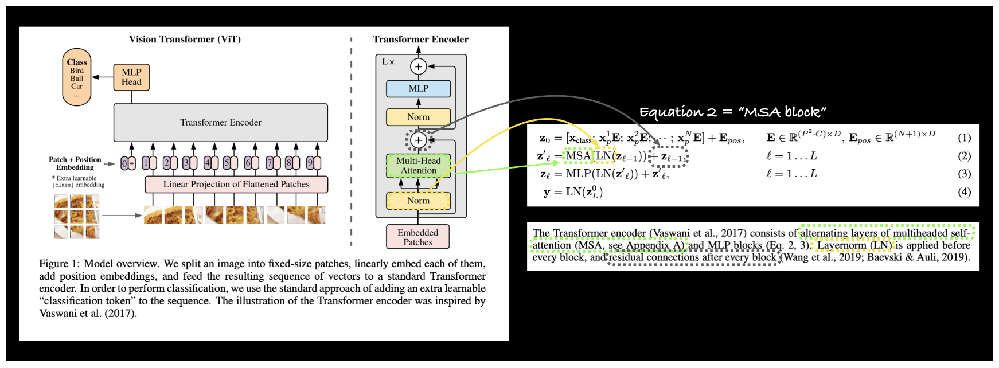

- Multi-Head Self Attention (MSA) : torch.nn.MultiheadAttention().
- Norm (LN or LayerNorm) : torch.nn.LayerNorm().
- Residual connection : add the input to output (we'll see this later on when we create the full Transformer Encoder block in section 7.1).

The LayerNorm (LN) layer

Layer Normalization (torch.nn.LayerNorm())은 마지막 차원에 대한 입력을 정규화한다..??  
주요 파라미터는 normalized_shape 이며, 앞에서의 D= 768 부분을 정규화 할 수 있다.  

레이어 정규화는 학습 시간과 모델 일반화(보이지 않는 데이터에 적응하는 능력)를 개선하는 데 도움이 됩니다.

저는 모든 종류의 정규화를 "데이터를 유사한 형식으로 가져오는 것" 또는 "데이터 샘플을 유사한 분포로 가져오는 것"이라고 생각합니다.

높이와 길이가 모두 다른 계단 세트를 오르내리려고 한다고 상상해 보세요.

각 계단마다 약간의 조정이 필요할 것 같죠?

그리고 각 계단에서 배운 것이 다음 계단에서는 도움이 되지 않아 계단을 오르는 데 걸리는 시간이 늘어날 수도 있습니다.

정규화(레이어 정규화 포함)는 계단이 데이터 샘플이라는 점을 제외하고 모든 계단의 높이와 길이를 동일하게 만드는 것과 같습니다.

따라서 높이와 길이가 비슷한 계단을 높이와 폭이 다른 계단보다 훨씬 쉽게 오르내릴 수 있는 것처럼, 신경망은 다양한 분포를 가진 데이터 샘플보다 유사한 분포(비슷한 평균과 표준 편차)를 가진 데이터 샘플에 대해 더 쉽게 최적화할 수 있습니다.

The Multi-Head Self Attention (MSA) layer

원래 텍스트 입력을 위해 설계된 기존의 셀프어텐션 메커니즘은 단어의 순서를 취한 다음 어떤 단어가 다른 단어에 더 많은 "주의"를 기울여야 하는지 계산합니다.

즉, "개가 울타리를 뛰어넘었다"라는 문장에서 "개"라는 단어는 "뛰어넘다" 및 "울타리"와 밀접한 관련이 있을 수 있습니다.

이것은 단순화되었지만 이미지에 대한 전제는 남아 있습니다.

입력은 단어가 아닌 이미지 패치 시퀀스이기 때문에 멀티헤드 어텐션이 어떤 이미지 패치가 다른 패치와 가장 관련이 있는지 계산하여 결국 이미지의 학습된 표현을 형성합니다.

하지만 가장 중요한 것은 레이어가 데이터가 주어지면 스스로 이 작업을 수행한다는 것입니다(어떤 패턴을 학습할지 알려주지 않음).

레이어가 MSA를 사용하여 형성한 학습된 표현이 좋으면 모델 성능에서 그 결과를 확인할 수 있습니다.

온라인에서 Transformer 아키텍처와 주의 메커니즘에 대해 자세히 알아볼 수 있는 자료는 Jay Alammar의 멋진 일러스트 트랜스포머 게시물과 일러스트 주의 게시물 등 여러 가지가 있습니다.

여기서는 직접 구현하는 것보다 기존 PyTorch MSA 구현을 코딩하는 데 더 중점을 두겠습니다.

그러나 ViT 백서의 MSA 구현에 대한 공식적인 정의는 부록 A에서 확인할 수 있습니다:

- https://jalammar.github.io/illustrated-transformer/
- https://jalammar.github.io/visualizing-neural-machine-translation-mechanics-of-seq2seq-models-with-attention/

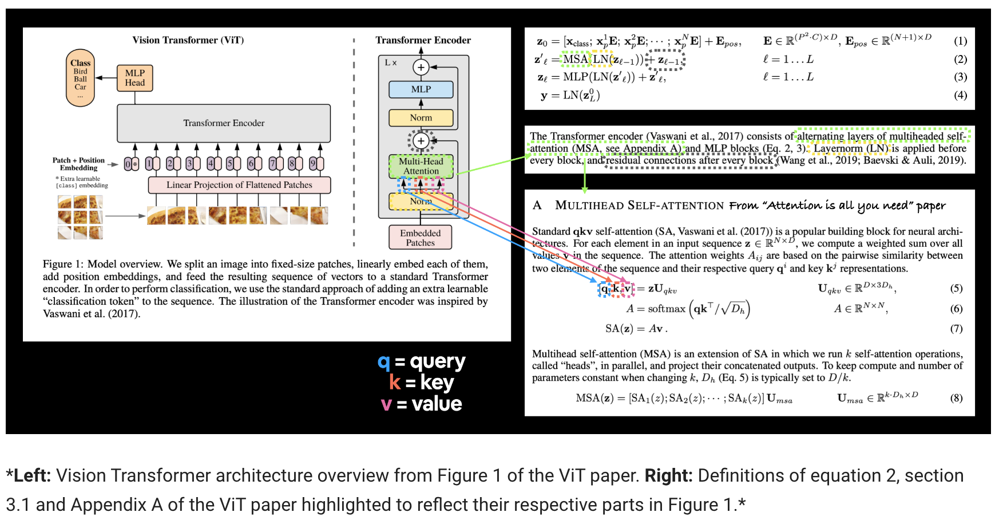

이를 쿼리, 키, 값 입력 또는 줄여서 QKV라고 하며, 셀프 어텐션 메커니즘의 기본입니다.

이 경우, 세 가지 임베딩 입력은 쿼리, 키, 값에 대한 세 가지 버전의 Norm 계층 출력입니다.

또는 4.8절에서 생성한 레이어 정규화 이미지 패치와 위치 임베딩의 세 가지 버전입니다.

torch.nn.MultiheadAttention()의 주요 파라미터는 다음과 같음.  
- embed_dim - the embedding dimension from Table 1 (Hidden size D).
- num_heads - how many attention heads to use (this is where the term "multihead" comes from), this value is also in Table 1 (Heads).
- dropout - whether or not to apply dropout to the attention layer (according to Appendix B.1, dropout isn't used after the qkv-projections).
- batch_first - does our batch dimension come first? (yes it does)

Replicating Equation 2 with PyTorch layers

- torch.nn.Module을 상속받아서 MultiheadSelfAttentionBlock 생성
- Table 1 의 ViT-Base model로 하이퍼파라미터 초기화
- torch.nn.LayerNorm()으로 normalization layer 생성. 이때 normalized_shape는 임베딩 디멘전 D와 같게...
- Create a multi-head attention (MSA) layer with the appropriate embed_dim, num_heads, dropout and batch_first parameters.  
- forward() 메서드 생성

In [58]:
# 1. 클래스 생서
class MultiheadSelfAttentionBlock(nn.Module):
    
    # 2.하이퍼파라미터 초기화
    def __init__(self,
                 embedding_dim: int=768,
                 num_heads: int = 12,
                 attn_dropout: float=0
                 ):
        super().__init__()
        
        # 3. create normalization layer
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)
        
        # 4. create MSA layer
        self.multihead_attn = nn.MultiheadAttention(embed_dim=embedding_dim,
                                                    num_heads = num_heads,
                                                    dropout=attn_dropout,
                                                    batch_first=True
                                                    )# does our batch dimension come first?
    
    def forward(self, x):
        x = self.layer_norm(x)
        attn_output, _ = self.multihead_attn(query=x,
                                             key = x,
                                             value = x,
                                             need_weights = False # do we need the weights or just the layer outputs?
                                             )
        
        return attn_output

- fig1과 다르게 우리의 MSA 블럭은 skip이나 residual connection을 포함하고 있지 않다.   
- 이것은 7.1에서 추가할 것이다.

빙금 만든 것을 테스트 해보자.

In [59]:
patch_and_position_embedding.shape

torch.Size([1, 197, 768])

In [60]:
# Create an instance of MSABlock
multihead_self_attention_block = MultiheadSelfAttentionBlock(embedding_dim=768, # from Table 1 
                                                             num_heads=12) # from Table 1

# Pass patch and position image embedding through MSABlock
patched_image_through_msa_block = multihead_self_attention_block(patch_and_position_embedding)
print(f"Input shape of MSA block: {patch_and_position_embedding.shape}")
print(f"Output shape MSA block: {patched_image_through_msa_block.shape}")

Input shape of MSA block: torch.Size([1, 197, 768])
Output shape MSA block: torch.Size([1, 197, 768])


데이터가 MSA 블록을 통과할 때 데이터의 입력 및 출력 형태가 어떻게 동일하게 유지되는지 주목하세요.

그렇다고 해서 데이터가 통과하면서 변하지 않는다는 의미는 아닙니다.

입력 및 출력 텐서를 인쇄하여 어떻게 변화하는지 확인할 수 있습니다(이 변화는 1 * 197 * 768 값에 걸쳐서 일어나므로 시각화하기 어려울 수 있습니다).

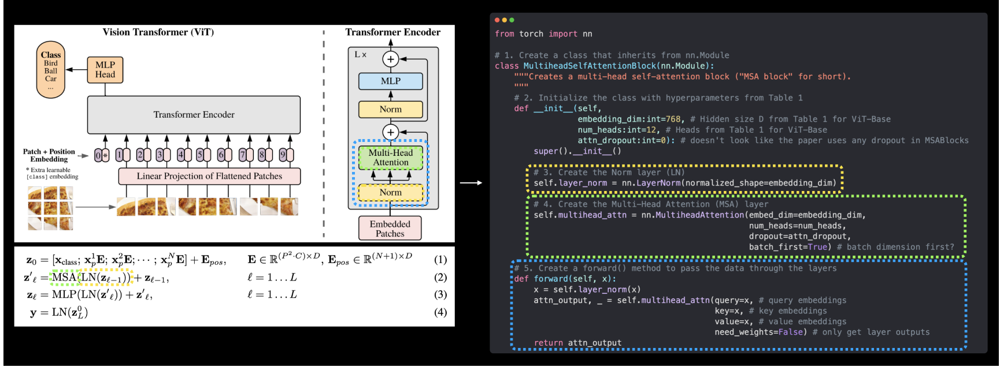

### 6. Equation 3: Multilayer Perceptron (MLP)


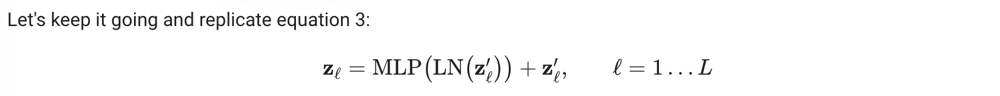

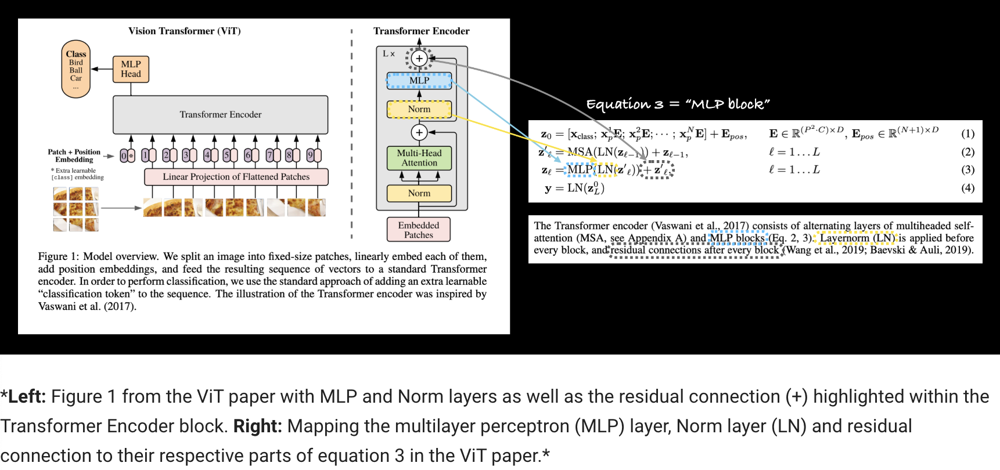

6.1 The MLP layer(s)

여기서는 다음의 패턴을 따른다.  
linear layer -> non-linear layer -> linear layer -> non-linear layer

- 선형은 torch.nn.Linear() 
- 비선형은 GELU (Gaussian Error Linear Units) non-linear activation function (torch.nn.GELU()) 사용

MLP 블록에 대한 또 다른 세부 사항은 appendix B.1(교육)에 나와 있습니다.

Table 3은 서로 다른 모델에 대한 우리의 훈련 설정을 요약한 것입니다. 훈련 중 과적합을 방지하기 위해 Dropout이 사용되며, qkv-projections 이후의 각 dense layer와 positional-to-patch embeddings를 추가한 직후에 적용됩니다.

이는 모든 linear 레이어가 dropout을 가진다는 의미이다.

논문에서는 table3에 설명되어 있다. (for ViT-Base, dropout=0.1)

따라서

layer norm -> linear layer -> non-linear layer -> dropout -> linear layer -> dropout

6.2 Replicating Equation 3 with PyTorch layers

- MLP 블럭 생성
- 하이퍼파라미터 설정
- layer normalization (LN) layer
- MLP 레이어 생서
- forward 생성

In [61]:
# 1. Create a class that inherits from nn.Module
class MLPBlock(nn.Module):
    """Creates a layer normalized multilayer perceptron block ("MLP block" for short)."""
    # 2. Initialize the class with hyperparameters from Table 1 and Table 3
    def __init__(self,
                 embedding_dim:int=768, # Hidden Size D from Table 1 for ViT-Base
                 mlp_size:int=3072, # MLP size from Table 1 for ViT-Base
                 dropout:float=0.1): # Dropout from Table 3 for ViT-Base
        super().__init__()
        
        # 3. Create the Norm layer (LN)
        self.layer_norm = nn.LayerNorm(normalized_shape=embedding_dim)
        
        # 4. Create the Multilayer perceptron (MLP) layer(s)
        self.mlp = nn.Sequential(
            nn.Linear(in_features=embedding_dim,
                      out_features=mlp_size),
            nn.GELU(), # "The MLP contains two layers with a GELU non-linearity (section 3.1)."
            nn.Dropout(p=dropout),
            nn.Linear(in_features=mlp_size, # needs to take same in_features as out_features of layer above
                      out_features=embedding_dim), # take back to embedding_dim
            nn.Dropout(p=dropout) # "Dropout, when used, is applied after every dense layer.."
        )
    
    # 5. Create a forward() method to pass the data throguh the layers
    def forward(self, x):
        x = self.layer_norm(x)
        x = self.mlp(x)
        return x

테스트

In [62]:
# Create an instance of MLPBlock
mlp_block = MLPBlock(embedding_dim=768, # from Table 1 
                     mlp_size=3072, # from Table 1
                     dropout=0.1) # from Table 3

# Pass output of MSABlock through MLPBlock
patched_image_through_mlp_block = mlp_block(patched_image_through_msa_block)
print(f"Input shape of MLP block: {patched_image_through_mlp_block.shape}")
print(f"Output shape MLP block: {patched_image_through_mlp_block.shape}")

Input shape of MLP block: torch.Size([1, 197, 768])
Output shape MLP block: torch.Size([1, 197, 768])


In [ ]:
- 입출력 shape가 그대로 유지된다.  
- 하지만 ㅡ